# Setting

## Library

In [1]:
import pandas as pd
import numpy as np
from scipy import stats 

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import random
import os
from tqdm.notebook import tqdm

In [4]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [5]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score # 정확도
from sklearn.metrics import precision_score # 정밀도
from sklearn.metrics import recall_score # 재현율
from sklearn.metrics import f1_score # F1-Score
from sklearn.metrics import confusion_matrix

## Seed

In [6]:
def my_seed_everywhere(seed):
    random.seed(seed) # random
    np.random.seed(seed) # numpy
    os.environ["PYTHONHASHSEED"] = str(seed) # os
    print(f'고정된 Seed : {seed}')

In [7]:
my_seed_everywhere(42)

고정된 Seed : 42


# Data Set

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
path_file = '/content/drive/MyDrive/UNIST/AICP/data/dynmom_dat.csv'

df = pd.read_csv(path_file)

# Preprocessing

In [10]:
def preprocessing(data):
  # 'DATE'를 칼럼 대신 인덱스로 사용
  data.index = data['DATE']
  data = data.drop(columns='DATE')
  print("'DATE'를 칼럼 대신 인덱스로 사용")

  # 결측치 제거 및 모델 학습에 불필요한 칼럼 제거
  data = data.dropna()
  data = data.drop(columns=['winner', 'loser', 'form_date'])
  print("결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')")

  return data

In [11]:
df = preprocessing(df)

'DATE'를 칼럼 대신 인덱스로 사용
결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')


In [12]:
def normal_wml(df):
  print("'wml'이 양수면 1 & 음수면 0")
  print("Output : 'Preprocessed_Data' & 'WML'")
  print()

  cond_wml = (df['wml']>=0)
  df.loc[cond_wml, 'pos_wml'] = 1
  df.loc[~cond_wml, 'pos_wml'] = 0
  WML = df[['wml']]

  df.drop(columns=['wml'], inplace=True)

  POS_WML = df['pos_wml'].value_counts()
  print(f'Ratio : {POS_WML[0]/POS_WML[1]}')
  print(POS_WML)

  return df, WML

In [13]:
dynmom, WML = normal_wml(df)

'wml'이 양수면 1 & 음수면 0
Output : 'Preprocessed_Data' & 'WML'

Ratio : 0.5634379263301501
1.0    733
0.0    413
Name: pos_wml, dtype: int64


# Modeling

In [45]:
def Roling_Windows(data, window_size, method, model, model_name, plot=True, plot_feature=True):

  # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
  result_dict = {
    'TRAIN_START_DATE':[],
    'TRAIN_END_DATE':[],
    'TEST_DATE':[],
    'Actual_POS_WML':[],
    f'{model_name}_PRED_POS_WML':[],
    f'{model_name}_PROB_POS_WML':[]
  }

  df_feature = pd.DataFrame()

  # 모델 학습이 종료되는 지점 설정
  end = data.shape[0] - window_size

  print('*'*50)
  print(f'\n{model_name} Model의 Rolling {method} Window를 실행합니다\n')
  print('설정된 Model의 하이퍼파리미터 : \n')
  for p, v in zip(model.get_params(deep=True).keys(), model.get_params(deep=True).values()):
    print(f'   {p} : {v}')
  print()
  print('*'*50)

  for i in tqdm(range(end)):

    # 모델 학습 중지
    if i == end:
      print('Prediction using machine learning has ended.')
      break
    
    # Rolling Fixed Window
    if method == 'Fixed':
      MODEL = model
      train = data.iloc[0+i:window_size+i]

    # Rolling Expanding Window
    elif method == 'Expanding':
      MODEL = model
      train = data.iloc[0:window_size+i]
    
    # 'method' 잘못입력한 경우
    else:
      print("Make sure to set the method to either 'Fixed' or 'Expanding'.")
      break
    
    # 테스트 데이터 설정
    test = data.iloc[[window_size+i]]

    # Features와 Target 구분
    X_train = train.drop(columns=['pos_wml'])
    y_train = train['pos_wml']

    X_test = test.drop(columns=['pos_wml'])
    y_test = test['pos_wml'] 

    # 모델 학습 및 추론
    MODEL.fit(X_train, y_train)
    pred_test = MODEL.predict(X_test)
    prob_test = MODEL.predict_proba(X_test)

    # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
    result_dict['TRAIN_START_DATE'].append(train.index[0])
    result_dict['TRAIN_END_DATE'].append(train.index[-1])
    result_dict['TEST_DATE'].append(test.index[0])

    result_dict['Actual_POS_WML'].append(list(y_test)[0])
    result_dict[f'{model_name}_PRED_POS_WML'].append(pred_test[0])
    result_dict[f'{model_name}_PROB_POS_WML'].append(prob_test[0][-1])

    # 트리 기반 모델 (사이킷런)의 Feature Importance 정보 수집
    feature_importances = MODEL.feature_importances_
    df_ft_importance = pd.DataFrame(feature_importances, index = X_train.columns).T
    df_ft_importance.index = y_test.index
    df_feature = pd.concat([df_feature, df_ft_importance])

  result = pd.DataFrame(result_dict)
  result.index = df_feature.index

  result = pd.concat([result, df_feature], axis=1)
  result = result.set_index('TEST_DATE')
  
  # 모델 성능 시각화
  if plot == True:
    plot_result(result, method, model_name)
  
  # 모델의 변수 중요도 시각화
  if plot_feature == True:
    plot_feature_importances(result)
    print()

  # 학습 및 테스트 데이터 정보, 실제값과 예측값 정보, 변수 중요도 정보
  return result

# 모델 성능 시각화
def plot_result(data, method, model_name):
  print('\nPerformance results of the model\n')

  # Confusion Matrix & etc
  print(classification_report(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML']))

  # Accuracy, Precision, Recall, F1 Score
  accuracy = accuracy_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  precision = precision_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  recall = recall_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  F1_score = f1_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])

  print(f'\naccuracy : {accuracy}')
  print(f'\nprecision : {precision}')
  print(f'\nrecall : {recall}')
  print(f'\nF1-Score : {F1_score}\n')
  
  # Visualization Confusion Matrix
  confusion = confusion_matrix(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  sns.heatmap(confusion, annot=True, fmt='g')
  plt.title(f'Performance results {method} of the {model_name} model')
  
  plt.show()

In [46]:
def plot_result(data, method, model_name):
  print('\nPerformance results of the model\n')

  # Confusion Matrix & etc
  print(classification_report(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML']))

  # Accuracy, Precision, Recall, F1 Score
  accuracy = accuracy_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  precision = precision_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  recall = recall_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  F1_score = f1_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])

  print(f'\naccuracy : {accuracy}')
  print(f'\nprecision : {precision}')
  print(f'\nrecall : {recall}')
  print(f'\nF1-Score : {F1_score}\n')
  
  # Visualization Confusion Matrix
  confusion = confusion_matrix(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  sns.heatmap(confusion, annot=True, fmt='g')
  plt.title(f'Performance results {method} of the {model_name} model')
  
  plt.show()

In [47]:
def plot_feature_importances(data):

  data = data[['mvol_cum6', 'mvol_t_1', 'mvol_t_2', 'mvol_t_3',
       'mvol_t_4', 'mvol_t_5', 'mvol_t_6', 'cum_loser', 'cum_winner',
       'cum_loser_t_2_4', 'cum_winner_t_2_4', 'cum_loser_t_5_8',
       'cum_winner_t_5_8', 'cum_loser_t_9_12', 'cum_winner_t_9_12']]

  print('\nFeature Importance of the model\n')

  # 날짜 별 Feature Importance 변화 추이
  plt.figure(figsize=(15, 5))
  for col in data.columns:

    sns.lineplot(data=data,
                x=data.index,
                y=col,
                label=col,
                alpha=0.3)
    
    plt.title('Feature importances using MDI')
    plt.xlabel('DATE')
    plt.ylabel('Mean decrease in impurity')
    plt.xticks([data.index[i] for i in range(0,len(data.index), 12)])
    plt.tick_params(axis='x',
                      direction='out',
                      labelrotation=45,
                      length=1,
                      pad=10,
                      labelsize=5,
                      width=0.1)
  plt.show()

  # 각 변수 별 Feature Importance 통계값
  MEAN = display_feature_importance(data, method='mean')
  MAX = display_feature_importance(data, method='max')
  MIN = display_feature_importance(data, method='min')

  plt.figure(figsize=(15, 5))
  sns.barplot(data=MEAN,
              y=MEAN.index,
              x='mean_Feature_Importance')

  plt.show()
  print()

  FEATURE_IMPORTANCE = pd.concat([MEAN, MAX, MIN], axis=1)
  display(FEATURE_IMPORTANCE)

In [48]:
def display_feature_importance(data, method):

    data = data[['mvol_cum6', 'mvol_t_1', 'mvol_t_2', 'mvol_t_3',
       'mvol_t_4', 'mvol_t_5', 'mvol_t_6', 'cum_loser', 'cum_winner',
       'cum_loser_t_2_4', 'cum_winner_t_2_4', 'cum_loser_t_5_8',
       'cum_winner_t_5_8', 'cum_loser_t_9_12', 'cum_winner_t_9_12']]
       
    feature_dict = {}
    for col in data.columns:
      if method=='mean':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].mean())

      if method=='max':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].max())
      
      if method=='min':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].min())
    
    feature_df = pd.DataFrame(feature_dict).T
    feature_df.columns = [method+'_'+'Feature_Importance']
    feature_df=feature_df.sort_values(by=method+'_'+'Feature_Importance', ascending=False)

    return feature_df

In [49]:
def slice_feature_importance(data, num, method, model_name):

  if type(num) != bool:
    division = int(data.shape[0]/num)
    
    for i in range(num):

      if i == num-1:
        sliced_data = data.iloc[i*division:]

      else:
        sliced_data = data.iloc[i*division:(i+1)*division]

      start = sliced_data.index[0]
      end = sliced_data.index[-1]

      print()
      print('*'*50)
      print(f'\nDATE : {start} ~ {end}\n')
      print('*'*50)
      print()
      
      plot_result(sliced_data, method, model_name)
      plot_feature_importances(sliced_data)
  
  else:
    start = input('Start Date (ex: 20200131): ')
    end = input('Start Date (ex: 20221230): ')
    print('*'*50)
    print(f'\nDate : {start} ~ {end}\n')
    print('*'*50)
    print()

    sliced_data = data.loc[start:end]
    plot_result(sliced_data, method, model_name)
    plot_feature_importances(sliced_data)

In [50]:
def cumm_return_by_dynamic(data, wml, weight, A0_P1, A1_P0,  plot=True):

  start_index = data.index[0]
  wml = wml.loc[start_index:]

  df = pd.DataFrame(wml['wml'] * data[weight])
  df.columns = ['cum_return']
  df['cum_return'] = (1 + df.cum_return).cumprod() - 1 
  
  S = df['cum_return'].mean()/df['cum_return'].std()

  print('Sharpe Ratio : {:0.5f}\n'.format(S))

  print('최근 누적 수익률\n')
  latly_10 = df.sort_index(ascending=False).head(5)
  for i, r in zip(latly_10.index, latly_10['cum_return']):
    i = str(i)
    print('  {}년-{}월 -> {:0.2f}'.format(i[:4], i[4:6], r))

  print('\n누적 수익률 가장 높았던 순간 Top 10\n')
  top_10 = df.sort_values(by='cum_return', ascending=False).head(10)
  rank = 1
  for i, r in zip(top_10.index, top_10['cum_return']):
    i = str(i)
    print('  {}등 : {}년-{}월 -> {:0.2f}'.format(rank, i[:4], i[4:6], r))
    rank += 1
  print()

  TEST_WML = wml.copy()
  TEST_WML['wml'] = (1 + TEST_WML.wml).cumprod() - 1
  TEST_WML.columns = ['cum_return'] 

  if plot == True:

    plt.figure(figsize=(13, 6))
    sns.lineplot(data=df, x=df.index, y=df['cum_return'], label='With_ML')
    sns.lineplot(data=TEST_WML, x=TEST_WML.index, y=TEST_WML['cum_return'], label='Original')
    plt.xticks([df.index[i] for i in range(0,len(df.index), 12)])
    plt.tick_params(axis='x',
                    direction='out',
                    labelrotation=45,
                    length=1,
                    pad=10,
                    labelsize=5,
                    width=5)
    for i in A0_P1:
      plt.vlines(i, -80000, 0, color='pink', linewidth=0.4, alpha=1)

    for i in A1_P0:
      plt.vlines(i, 80000, 0, color='pink', linewidth=0.4, alpha=1)

    plt.legend(fontsize=10)
    plt.show() 

  return df

In [51]:
def What_Pred(data, WML, model_name):

  start_index = data.index[0]
  WML = WML.loc[start_index:]
  WML.index.name = 'TEST_DATE'

  Q1 = WML.quantile(0.25)
  Q3 = WML.quantile(0.75)
  IQR = Q3 - Q1

  Upper = Q3 + (1.5*IQR)
  Lower = Q1 - (1.5*IQR)

  print('\nIQR 기준 WML 이상치 (Maximum 미만) 개수\n')

  cond_U = (WML['wml']>Upper[0])  
  WML_U = WML.loc[cond_U]
  
  print(f'Number of Outlier by IQR (Maximum) : {WML_U.shape[0]}')
  print(f'Maximum by IQR : {Upper[0]}')
  print(f"Max Outlier : {WML_U['wml'].max()}")
  print(f"Min Outlier : {WML_U['wml'].min()}")

  Result = pd.concat([data, WML],axis=1)
  Result = Result[['Actual_POS_WML', f'{model_name}_PRED_POS_WML', 'wml']]

  cond_1 = (Result['Actual_POS_WML'] == 1) & (Result[f'{model_name}_PRED_POS_WML'] == 1)
  R_1 = Result.loc[cond_1]
  print('\nACTUAL = PRED = 1\n')
  sns.boxplot(data=R_1, x='wml')
  plt.show()
  display(R_1[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  print('\nIQR 기준 WML 이상치 (Minimum 미만) 개수\n')

  cond_L = (WML['wml']<Lower[0])  
  WML_L = WML.loc[cond_L]
  
  print(f'Number of Outlier by IQR (Minimum) : {WML_L.shape[0]}')
  print(f'Minimun by IQR : {Lower[0]}')
  print(f"Max Outlier : {WML_L['wml'].max()}")
  print(f"Min Outlier : {WML_L['wml'].min()}")

  Result = pd.concat([data, WML],axis=1)
  Result = Result[['Actual_POS_WML', f'{model_name}_PRED_POS_WML', 'wml']]

  cond_0 = (Result['Actual_POS_WML'] == 0) & (Result[f'{model_name}_PRED_POS_WML'] == 0)
  R_0 = Result.loc[cond_0]
  print('\nACTUAL = PRED = 0\n')
  sns.boxplot(data=R_0, x='wml')
  plt.show()
  display(R_0[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  cond_0_1 = (Result['Actual_POS_WML'] == 0) & (Result[f'{model_name}_PRED_POS_WML'] == 1)
  R_0_1 = Result.loc[cond_0_1]
  print('\nACTUAL = 0 &  PRED = 1\n')
  sns.boxplot(data=R_0_1, x='wml')
  plt.show()
  display(R_0_1[['wml']].describe().T)
  print()
  print('틀린 예측 날짜')
  print()
  for i, date in enumerate(list(R_0_1.index)):
    if i % 10 == 0:
      print()
    else:
      print(date , end=', ')

  print()
  print('-'*80)
  print()

  cond_1_0 = (Result['Actual_POS_WML'] == 1) & (Result[f'{model_name}_PRED_POS_WML'] == 0)
  R_1_0 = Result.loc[cond_1_0]
  print('\nACTUAL = 1 &  PRED = 0\n')
  sns.boxplot(data=R_1_0, x='wml')
  plt.show()
  display(R_1_0[['wml']].describe().T)
  print()
  print('틀린 예측 날짜')
  print()
  for i, date in enumerate(list(R_1_0.index)):
   if i % 10 == 0:
    print()
   else:
    print(date , end=', ')
  print()

  return list(R_0_1.index), list(R_1_0.index)

## Rolling Fixed Windows

### Random Forest

In [52]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

**************************************************

RDF Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.46      0.26      0.33       316
         1.0       0.68      0.84      0.75       590

    accuracy                           0.63       906
   macro avg       0.57      0.55      0.54       906
weighted avg       0.60      0.63      0.60       906


accuracy : 0.6335540838852097

precision : 0.6771978021978022

recall : 0.8355932203389831

F1-Score : 0.7481031866464339



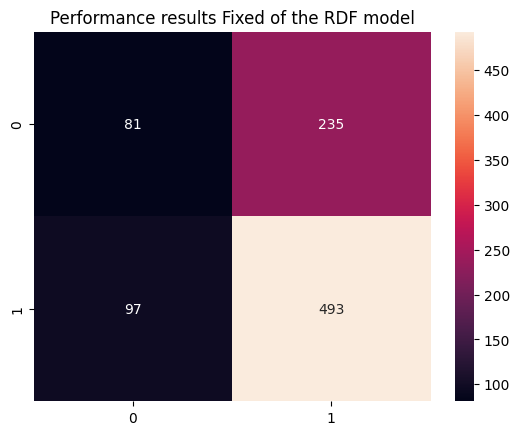


Feature Importance of the model



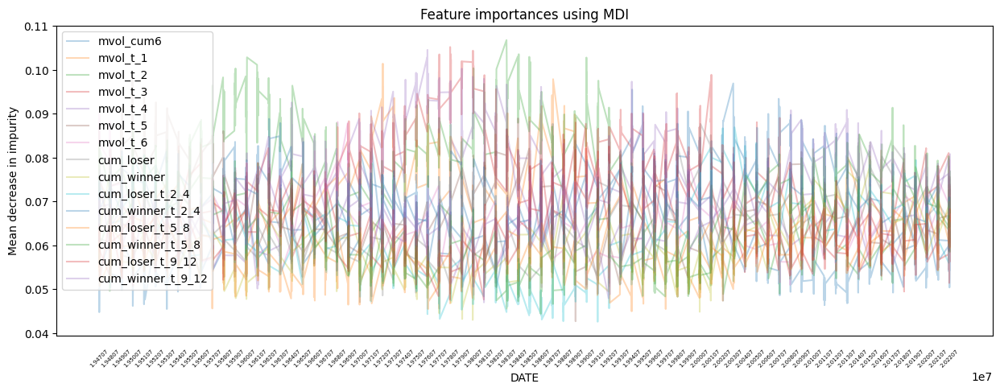

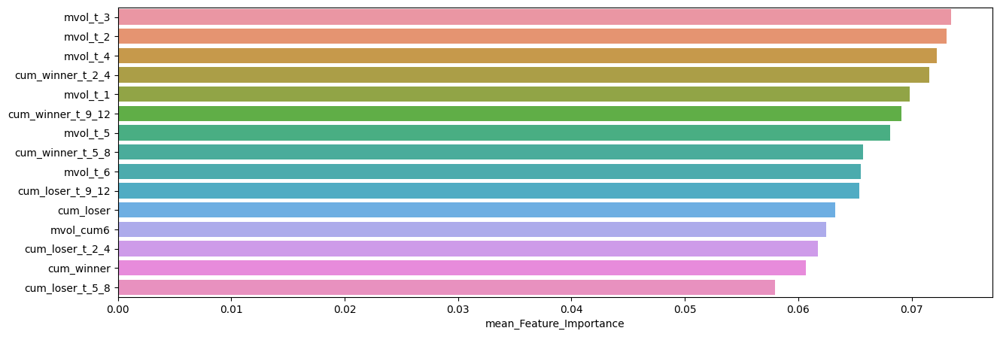

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_3,0.073464,0.105243,0.050744
mvol_t_2,0.073097,0.106831,0.048288
mvol_t_4,0.072231,0.104591,0.050169
cum_winner_t_2_4,0.071535,0.096941,0.050474
mvol_t_1,0.069825,0.101452,0.052625
cum_winner_t_9_12,0.069094,0.092603,0.047019
mvol_t_5,0.068079,0.097758,0.042722
cum_winner_t_5_8,0.065709,0.091414,0.044402
mvol_t_6,0.065513,0.090149,0.048724
cum_loser_t_9_12,0.065398,0.098914,0.047663


In [53]:
Fixed_RDF_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=RDF, # 사용할 모델
                                  model_name='RDF', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.28      0.34        75
         1.0       0.70      0.82      0.75       151

    accuracy                           0.64       226
   macro avg       0.57      0.55      0.55       226
weighted avg       0.61      0.64      0.62       226


accuracy : 0.6415929203539823

precision : 0.6966292134831461

recall : 0.8211920529801324

F1-Score : 0.7537993920972643



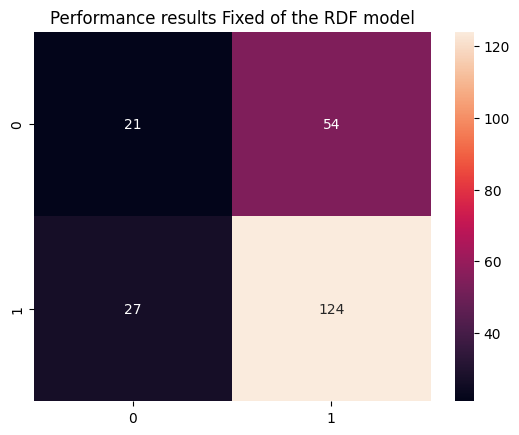


Feature Importance of the model



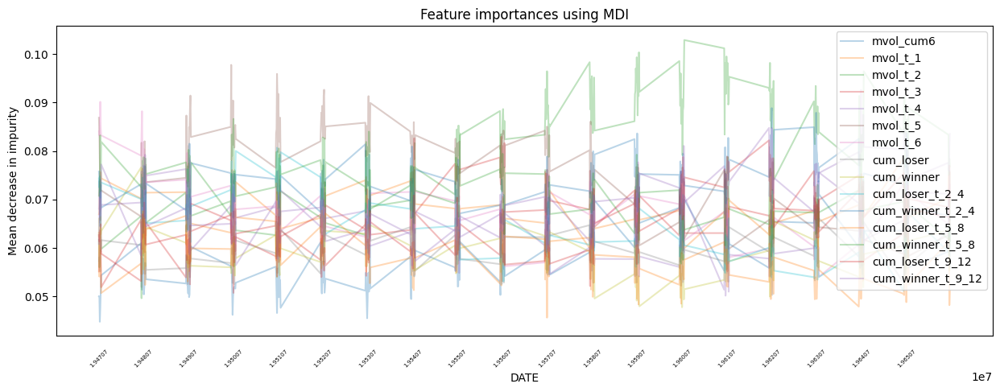

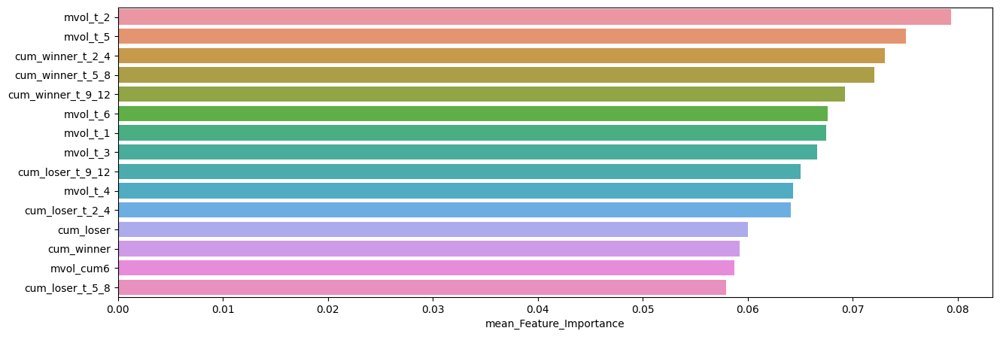

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.079354,0.102888,0.049638
mvol_t_5,0.075101,0.097758,0.054458
cum_winner_t_2_4,0.073087,0.088853,0.060745
cum_winner_t_5_8,0.072062,0.088252,0.056766
cum_winner_t_9_12,0.069276,0.092603,0.054863
mvol_t_6,0.067629,0.090149,0.054054
mvol_t_1,0.067492,0.078586,0.054114
mvol_t_3,0.066633,0.082962,0.050744
cum_loser_t_9_12,0.065072,0.082207,0.052155
mvol_t_4,0.064287,0.076724,0.050169



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.48      0.27      0.34        75
         1.0       0.70      0.85      0.77       151

    accuracy                           0.66       226
   macro avg       0.59      0.56      0.56       226
weighted avg       0.63      0.66      0.63       226


accuracy : 0.6592920353982301

precision : 0.7010869565217391

recall : 0.8543046357615894

F1-Score : 0.7701492537313434



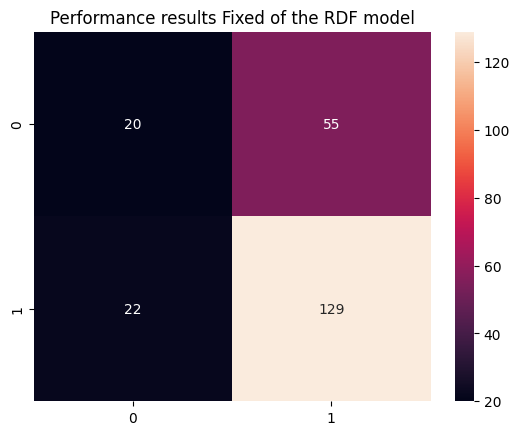


Feature Importance of the model



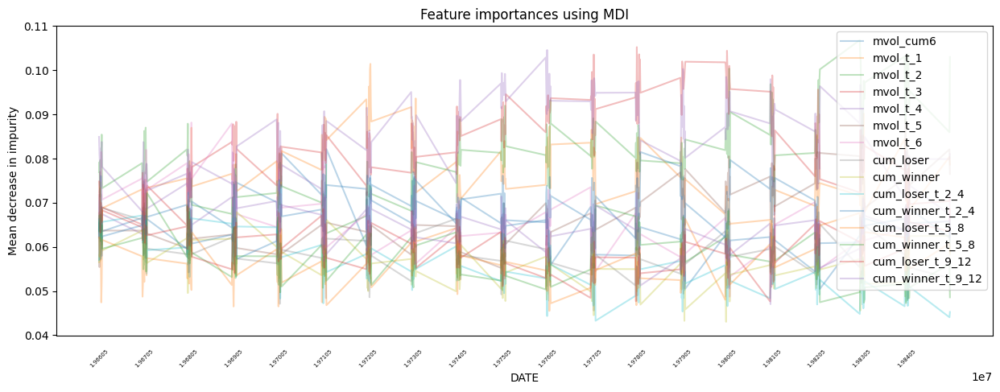

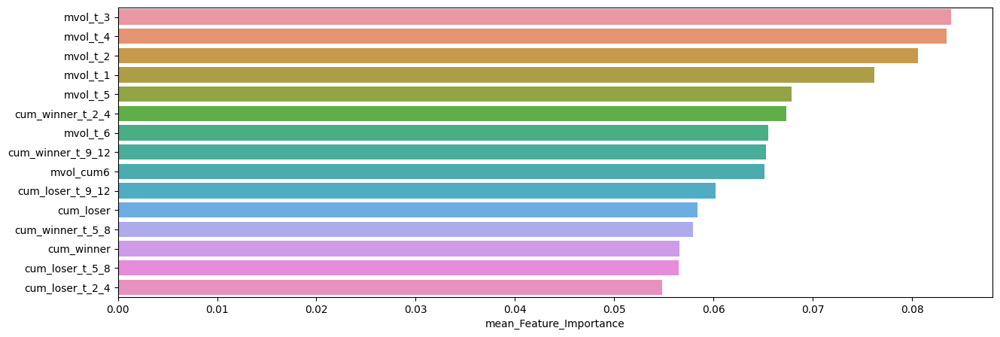

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_3,0.083916,0.105243,0.060569
mvol_t_4,0.083446,0.104591,0.060484
mvol_t_2,0.080628,0.106831,0.058587
mvol_t_1,0.076237,0.101452,0.059480
mvol_t_5,0.067880,0.088966,0.055248
cum_winner_t_2_4,0.067313,0.081491,0.050474
mvol_t_6,0.065535,0.088169,0.048724
cum_winner_t_9_12,0.065319,0.084925,0.047019
mvol_cum6,0.065165,0.082133,0.050535
cum_loser_t_9_12,0.060236,0.074813,0.047663



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.19      0.25        70
         1.0       0.70      0.87      0.78       156

    accuracy                           0.66       226
   macro avg       0.55      0.53      0.52       226
weighted avg       0.61      0.66      0.62       226


accuracy : 0.6592920353982301

precision : 0.7046632124352331

recall : 0.8717948717948718

F1-Score : 0.7793696275071633



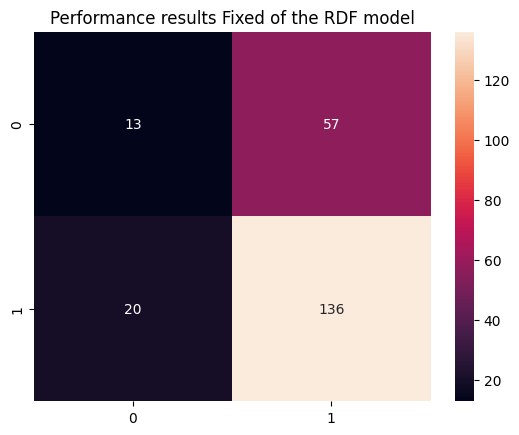


Feature Importance of the model



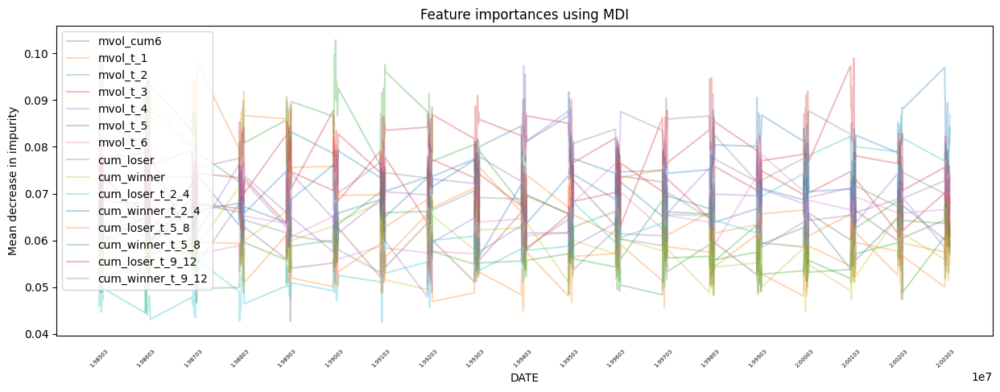

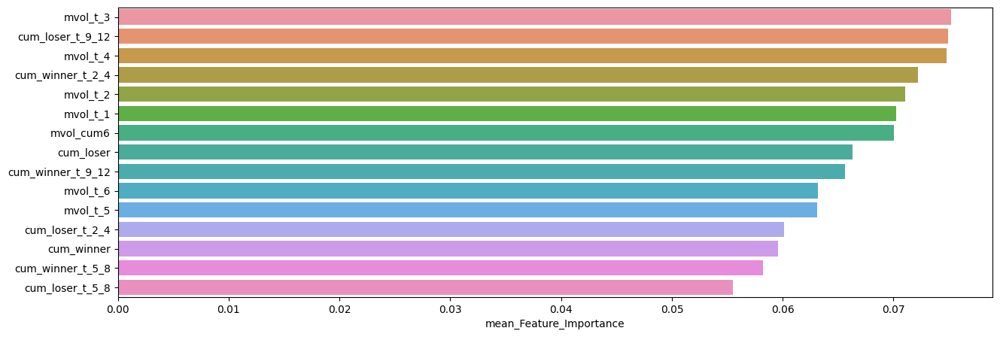

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_3,0.075177,0.090976,0.058646
cum_loser_t_9_12,0.074944,0.098914,0.058045
mvol_t_4,0.074786,0.097350,0.054636
cum_winner_t_2_4,0.072197,0.096941,0.056590
mvol_t_2,0.071032,0.102836,0.048288
mvol_t_1,0.070263,0.097911,0.052625
mvol_cum6,0.070002,0.095532,0.047414
cum_loser,0.066284,0.087708,0.052287
cum_winner_t_9_12,0.065628,0.080930,0.047967
mvol_t_6,0.063176,0.078334,0.050472



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.49      0.28      0.36        96
         1.0       0.60      0.79      0.68       132

    accuracy                           0.57       228
   macro avg       0.55      0.53      0.52       228
weighted avg       0.55      0.57      0.55       228


accuracy : 0.5745614035087719

precision : 0.6011560693641619

recall : 0.7878787878787878

F1-Score : 0.6819672131147542



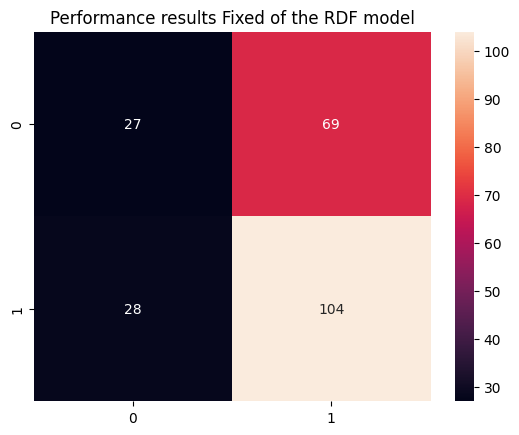


Feature Importance of the model



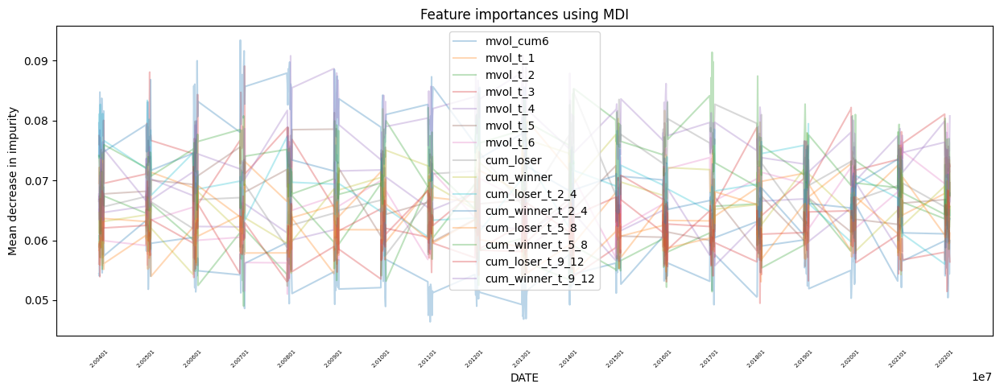

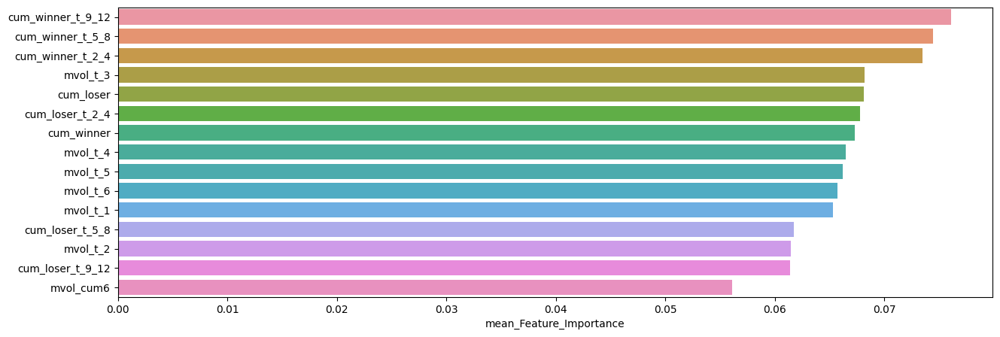

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_9_12,0.076092,0.090919,0.060839
cum_winner_t_5_8,0.074492,0.091414,0.061087
cum_winner_t_2_4,0.073527,0.093441,0.056690
mvol_t_3,0.068176,0.089104,0.053083
cum_loser,0.068152,0.085272,0.055775
cum_loser_t_2_4,0.067775,0.083383,0.056048
cum_winner,0.067318,0.081965,0.054273
mvol_t_4,0.066458,0.079981,0.055053
mvol_t_5,0.066237,0.081323,0.055327
mvol_t_6,0.065713,0.079529,0.051035


In [54]:
slice_feature_importance(Fixed_RDF_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'RDF') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



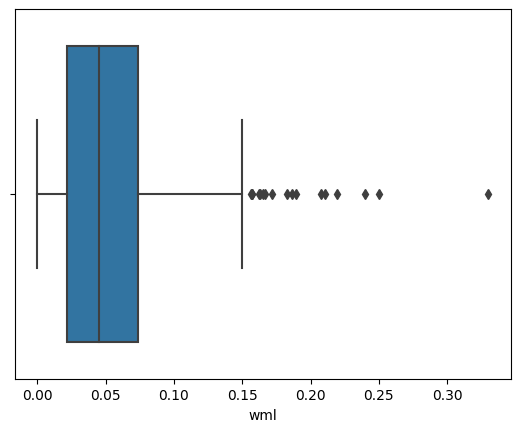

,count,mean,std,min,25%,50%,75%,max
wml,493.0,0.054058,0.044166,0.000007,0.021964,0.045201,0.073414,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



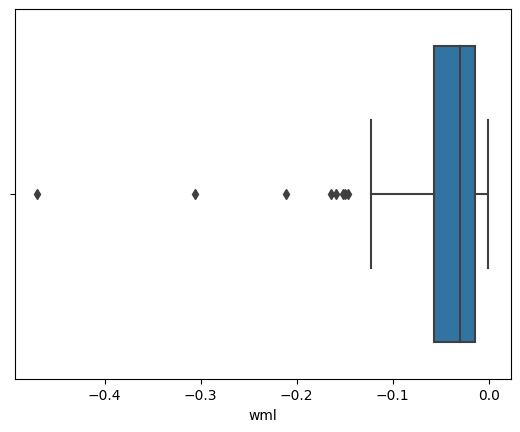

,count,mean,std,min,25%,50%,75%,max
wml,81.0,-0.054199,0.071408,-0.469903,-0.057294,-0.029816,-0.013911,-0.000506



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



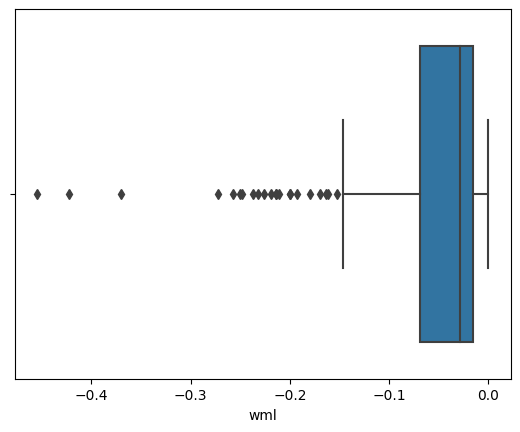

,count,mean,std,min,25%,50%,75%,max
wml,235.0,-0.057039,0.071314,-0.454349,-0.068636,-0.028471,-0.015196,-0.000132



틀린 예측 날짜


19490131, 19490630, 19490729, 19490930, 19491231, 19500131, 19500429, 19500630, 19500731, 
19510531, 19510629, 19510831, 19520229, 19520731, 19521128, 19530227, 19530331, 19540129, 
19540831, 19541231, 19550729, 19551031, 19551230, 19560131, 19560831, 19570131, 19580131, 
19580630, 19580829, 19581231, 19590529, 19590731, 19600129, 19600729, 19600930, 19610531, 
19611229, 19620131, 19620330, 19620731, 19621130, 19630628, 19640630, 19640731, 19641030, 
19650226, 19650630, 19651231, 19660531, 19660831, 19660930, 19670731, 19680131, 19680229, 
19680730, 19681031, 19690228, 19691031, 19700831, 19700930, 19701231, 19710226, 19710730, 
19720831, 19721130, 19730731, 19730928, 19740131, 19740329, 19750131, 19750228, 19750530, 
19760227, 19760528, 19760630, 19761029, 19770228, 19770831, 19780428, 19780929, 19781031, 
19790228, 19790330, 19790731, 19800331, 19800731, 19801231, 19810331, 19810630, 19810731, 
19820831, 19830131, 19830531, 19830930, 19831230, 19840229, 19840831, 19850131

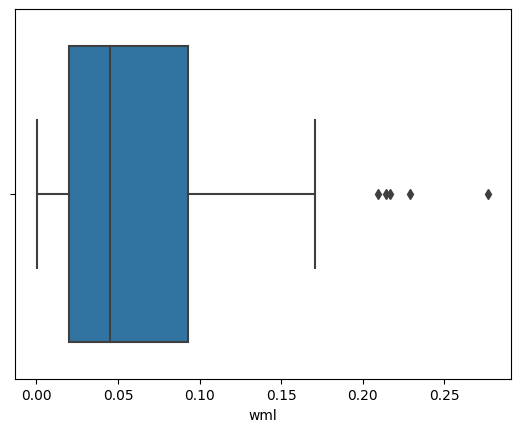

,count,mean,std,min,25%,50%,75%,max
wml,97.0,0.061307,0.058335,0.000577,0.020052,0.044931,0.092926,0.276912



틀린 예측 날짜


19471031, 19480228, 19480528, 19490831, 19491031, 19491130, 19500531, 19500831, 19501031, 
19520131, 19520529, 19530130, 19530630, 19540226, 19550131, 19550228, 19560531, 19580228, 
19581031, 19590831, 19630228, 19640228, 19660131, 19660228, 19661130, 19670331, 19680329, 
19680531, 19690430, 19690829, 19700227, 19700331, 19710430, 19720131, 19730330, 19730629, 
19731130, 19740228, 19761130, 19800630, 19830228, 19830331, 19830429, 19831130, 19880229, 
19910328, 19910531, 19911231, 19920331, 19951229, 19960531, 19980331, 19990630, 19990831, 
20000131, 20000630, 20000831, 20001229, 20010228, 20011231, 20030930, 20031031, 20040331, 
20041130, 20080630, 20080930, 20090130, 20090630, 20091030, 20100331, 20100430, 20100730, 
20140131, 20140731, 20141128, 20150731, 20161031, 20180831, 20180928, 20190531, 20200131, 
20210430, 20210930, 20220131, 20220930, 20221031, 20221130, 


In [55]:
RDF_A0_P1, RDF_A1_P0 = What_Pred(Fixed_RDF_Result, WML, 'RDF')

Sharpe Ratio : 0.70178

최근 누적 수익률

  2022년-12월 -> 57177.52
  2022년-11월 -> 51515.84
  2022년-10월 -> 51515.84
  2022년-09월 -> 51515.84
  2022년-08월 -> 51515.84

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 110793.42
  2등 : 2008년-11월 -> 101045.73
  3등 : 2008년-12월 -> 98654.05
  4등 : 2009년-01월 -> 98654.05
  5등 : 2002년-09월 -> 93996.18
  6등 : 2008년-10월 -> 92145.17
  7등 : 2008년-05월 -> 88385.66
  8등 : 2008년-06월 -> 88385.66
  9등 : 2008년-07월 -> 88385.66
  10등 : 2008년-08월 -> 86990.94



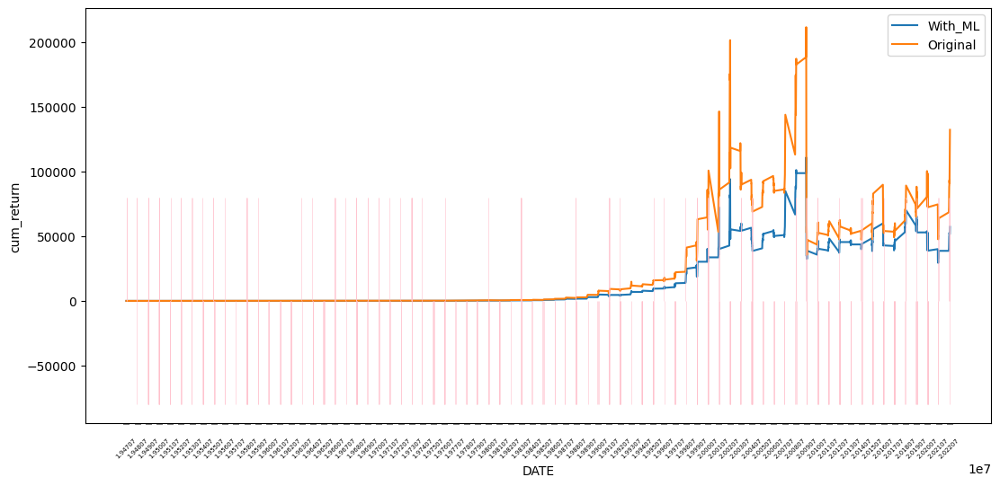

In [56]:
RDF_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_RDF_Result,
                                                 WML,
                                                 'RDF_PRED_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.76232

최근 누적 수익률

  2022년-12월 -> 7338.69
  2022년-11월 -> 6898.88
  2022년-10월 -> 6739.84
  2022년-09월 -> 6361.36
  2022년-08월 -> 6093.39

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 8508.18
  2등 : 2002년-09월 -> 8171.00
  3등 : 2008년-11월 -> 7986.88
  4등 : 2009년-01월 -> 7959.64
  5등 : 2008년-12월 -> 7879.11
  6등 : 2008년-06월 -> 7607.30
  7등 : 2008년-10월 -> 7528.67
  8등 : 2002년-07월 -> 7447.23
  9등 : 2022년-12월 -> 7338.69
  10등 : 2002년-08월 -> 7291.87



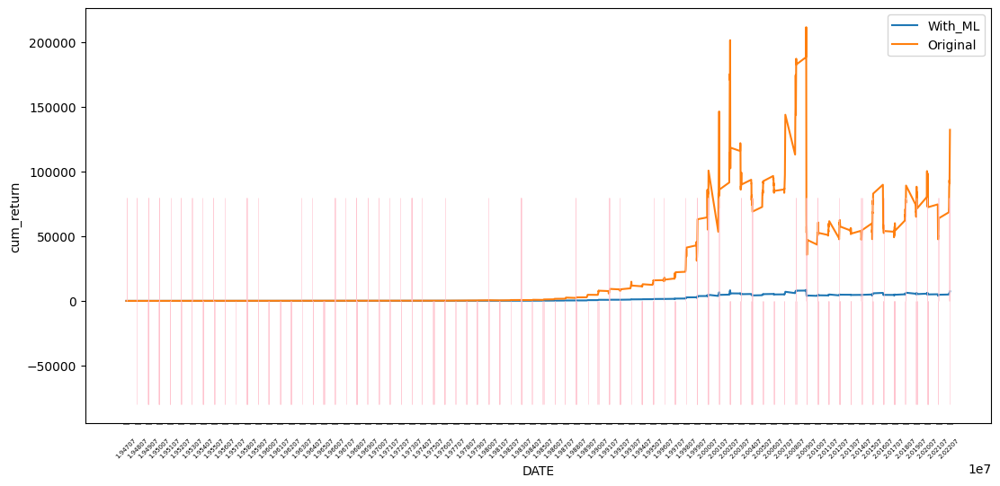

In [68]:
RDF_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_RDF_Result,
                                                 WML,
                                                 'RDF_PROB_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

### Grdient Boosting

In [60]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

**************************************************

GBC Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.28      0.33       316
         1.0       0.67      0.77      0.72       590

    accuracy                           0.60       906
   macro avg       0.53      0.53      0.52       906
weighted avg       0.57      0.60      0.58       906


accuracy : 0.6015452538631346

precision : 0.6681350954478708

recall : 0.7711864406779662

F1-Score : 0.7159716758457908



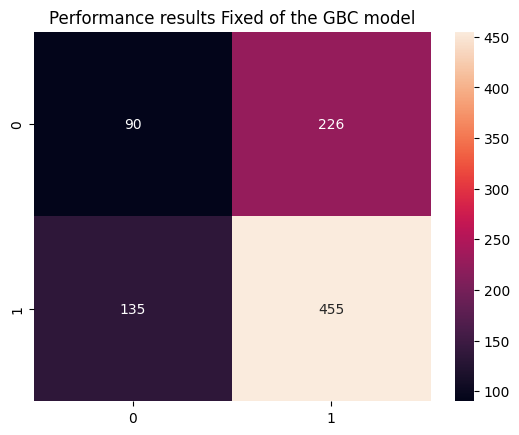


Feature Importance of the model



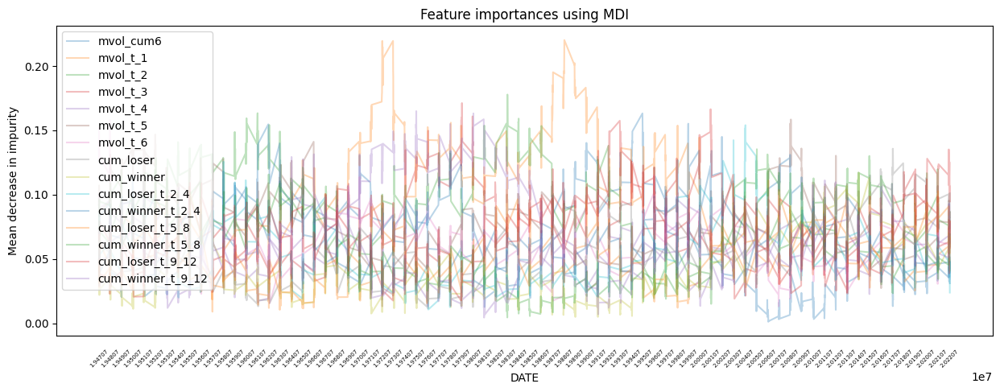

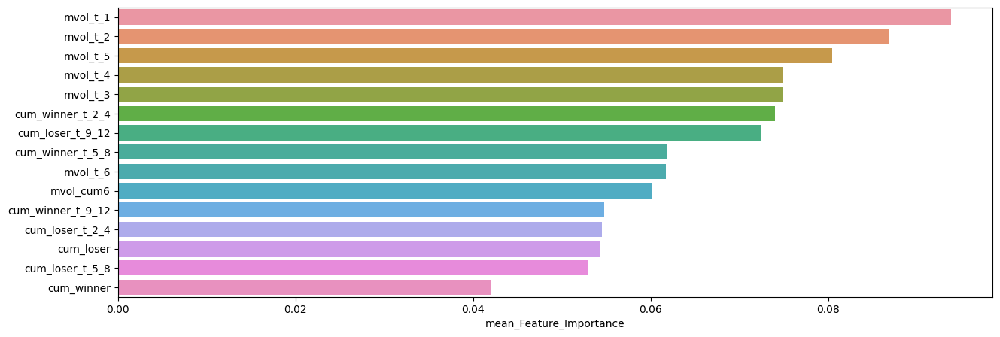

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.093818,0.220118,0.009135
mvol_t_2,0.086869,0.177779,0.015199
mvol_t_5,0.080435,0.158419,0.013340
mvol_t_4,0.074961,0.164923,0.016122
mvol_t_3,0.074867,0.171179,0.019198
cum_winner_t_2_4,0.073994,0.155154,0.024254
cum_loser_t_9_12,0.072518,0.166409,0.017762
cum_winner_t_5_8,0.061864,0.135360,0.004652
mvol_t_6,0.061737,0.157886,0.013340
mvol_cum6,0.060219,0.163172,0.001322


In [61]:
Fixed_GBC_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=GBC, # 사용할 모델
                                  model_name='GBC', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.29      0.23      0.25        75
         1.0       0.65      0.72      0.69       151

    accuracy                           0.56       226
   macro avg       0.47      0.47      0.47       226
weighted avg       0.53      0.56      0.54       226


accuracy : 0.5575221238938053

precision : 0.6526946107784432

recall : 0.7218543046357616

F1-Score : 0.6855345911949686



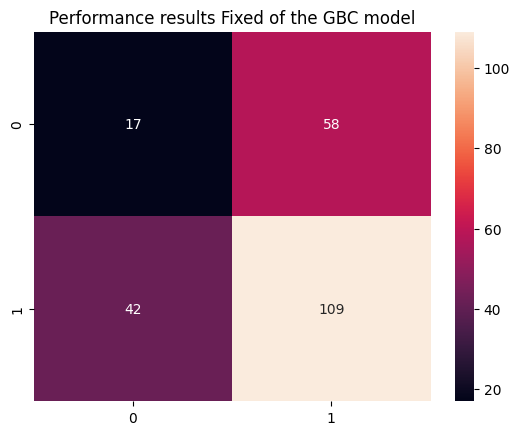


Feature Importance of the model



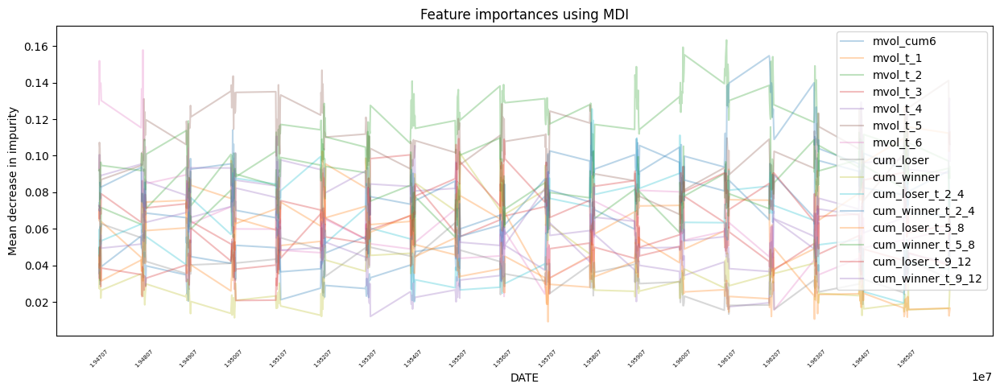

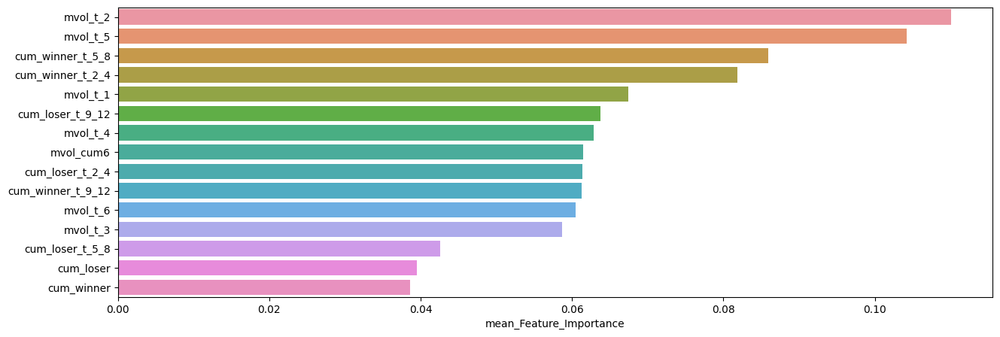

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.110054,0.163309,0.031805
mvol_t_5,0.104197,0.146791,0.063035
cum_winner_t_5_8,0.085880,0.128575,0.050270
cum_winner_t_2_4,0.081839,0.154702,0.033172
mvol_t_1,0.067476,0.126817,0.009135
cum_loser_t_9_12,0.063745,0.109307,0.020767
mvol_t_4,0.062896,0.110637,0.016122
mvol_cum6,0.061450,0.110454,0.020437
cum_loser_t_2_4,0.061344,0.125614,0.019423
cum_winner_t_9_12,0.061241,0.131427,0.012042



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.32      0.36        75
         1.0       0.70      0.78      0.74       151

    accuracy                           0.63       226
   macro avg       0.56      0.55      0.55       226
weighted avg       0.61      0.63      0.61       226


accuracy : 0.6283185840707964

precision : 0.6982248520710059

recall : 0.7814569536423841

F1-Score : 0.7375



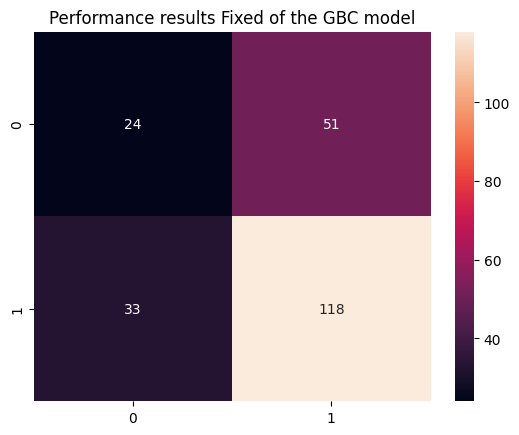


Feature Importance of the model



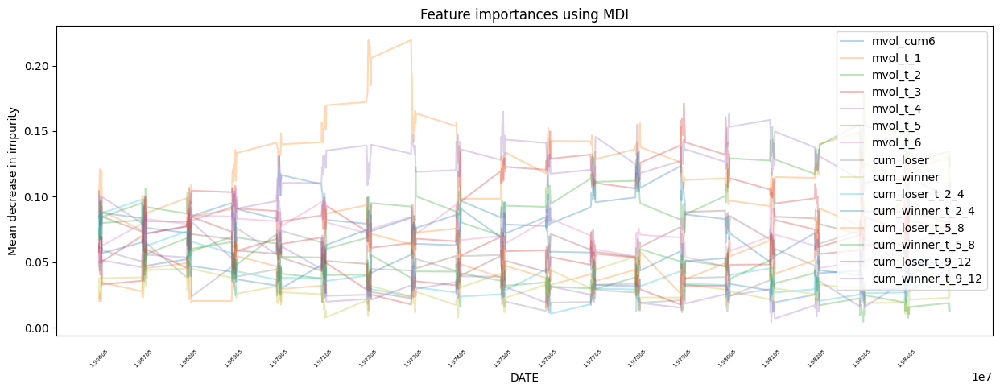

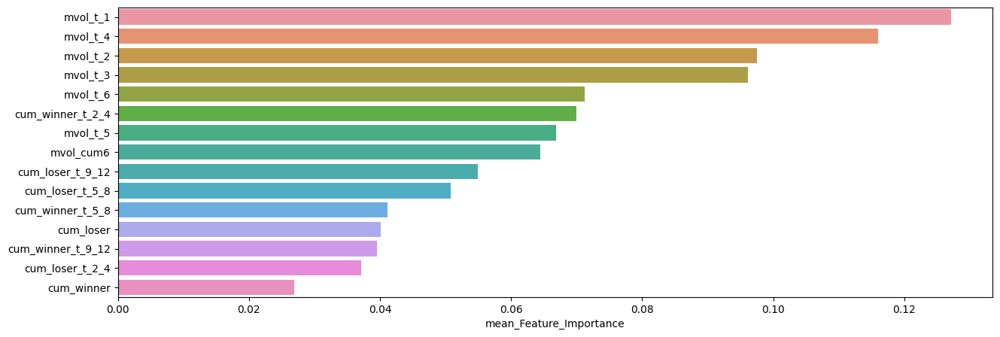

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.127102,0.219448,0.063345
mvol_t_4,0.116011,0.164923,0.036688
mvol_t_2,0.097497,0.177779,0.037783
mvol_t_3,0.096083,0.171179,0.033112
mvol_t_6,0.071249,0.113652,0.039314
cum_winner_t_2_4,0.070008,0.133878,0.030186
mvol_t_5,0.066907,0.106938,0.013340
mvol_cum6,0.064501,0.130453,0.012792
cum_loser_t_9_12,0.054933,0.100535,0.017762
cum_loser_t_5_8,0.050771,0.113288,0.015449



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.26      0.31        70
         1.0       0.71      0.83      0.77       156

    accuracy                           0.65       226
   macro avg       0.56      0.54      0.54       226
weighted avg       0.62      0.65      0.63       226


accuracy : 0.6504424778761062

precision : 0.712707182320442

recall : 0.8269230769230769

F1-Score : 0.7655786350148367



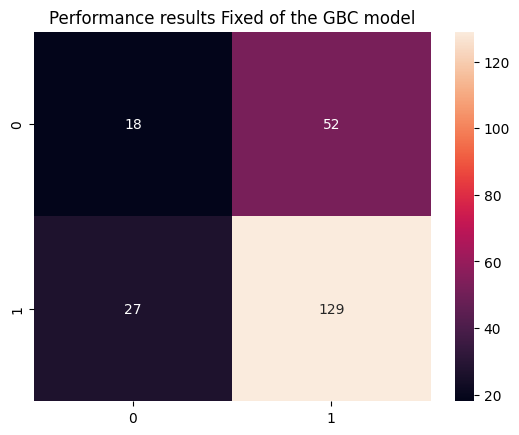


Feature Importance of the model



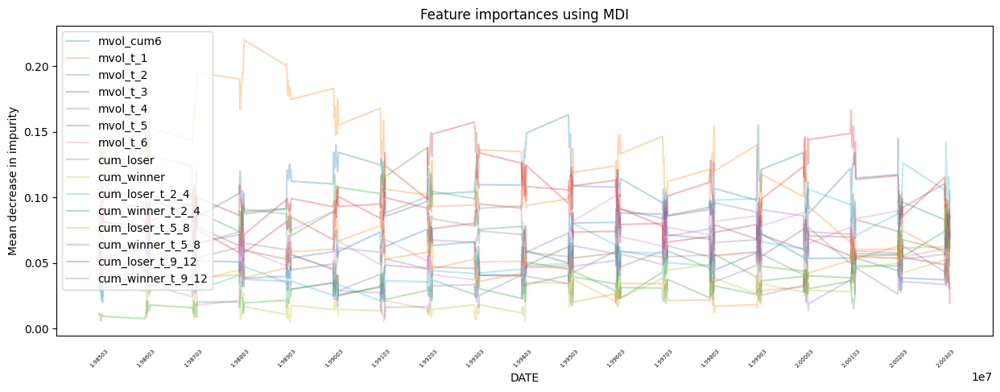

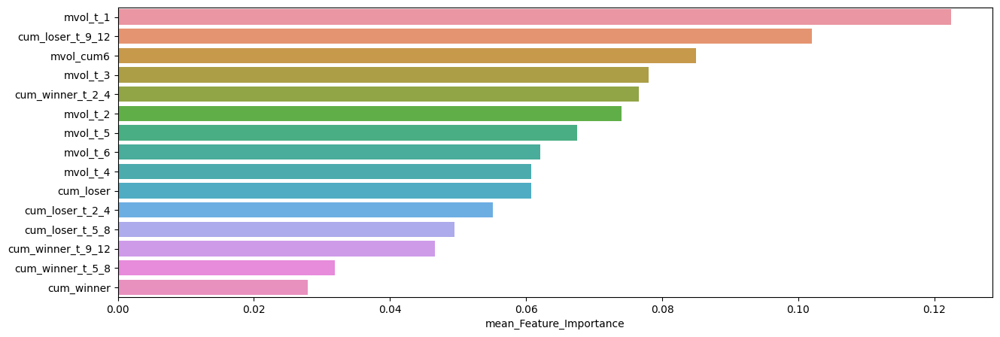

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.122433,0.220118,0.035740
cum_loser_t_9_12,0.101965,0.166409,0.061136
mvol_cum6,0.084941,0.163172,0.019728
mvol_t_3,0.078049,0.125667,0.019198
cum_winner_t_2_4,0.076596,0.155154,0.032056
mvol_t_2,0.073979,0.153429,0.015199
mvol_t_5,0.067448,0.110466,0.024857
mvol_t_6,0.062032,0.115227,0.017705
mvol_t_4,0.060808,0.118792,0.021272
cum_loser,0.060727,0.102462,0.028710



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.48      0.32      0.39        96
         1.0       0.60      0.75      0.67       132

    accuracy                           0.57       228
   macro avg       0.54      0.54      0.53       228
weighted avg       0.55      0.57      0.55       228


accuracy : 0.5701754385964912

precision : 0.6036585365853658

recall : 0.75

F1-Score : 0.668918918918919



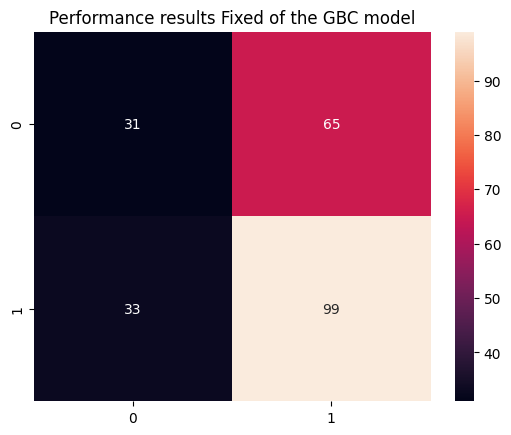


Feature Importance of the model



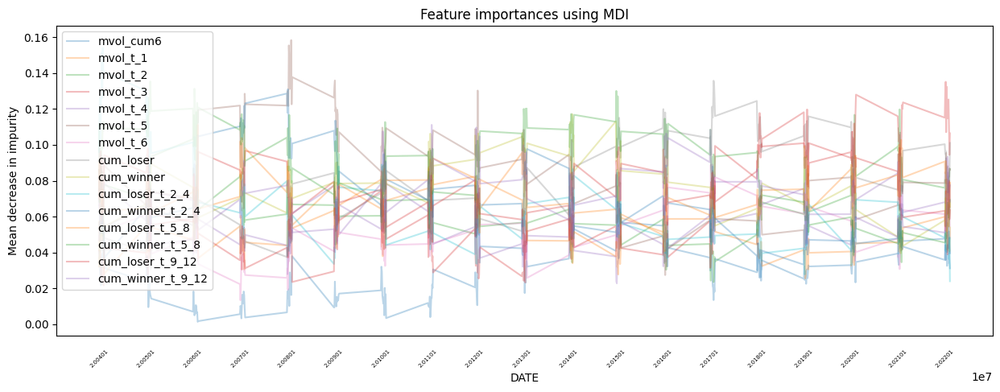

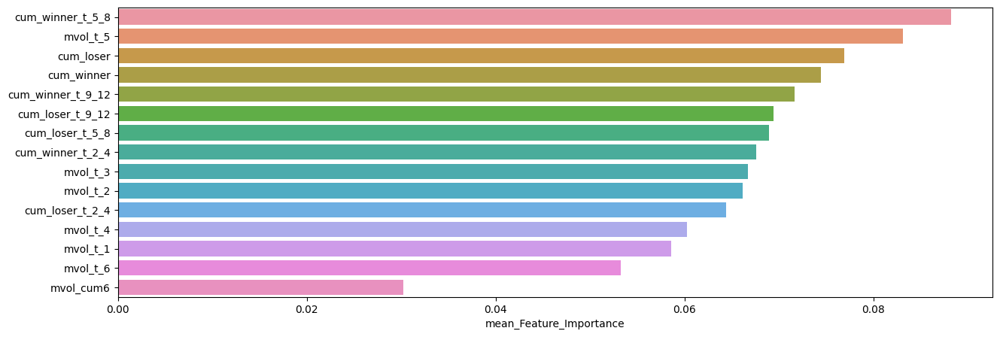

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.088207,0.135360,0.034521
mvol_t_5,0.083165,0.158419,0.027400
cum_loser,0.076920,0.135757,0.030580
cum_winner,0.074455,0.117165,0.032056
cum_winner_t_9_12,0.071634,0.111186,0.038961
cum_loser_t_9_12,0.069455,0.119766,0.023243
cum_loser_t_5_8,0.068961,0.111084,0.027726
cum_winner_t_2_4,0.067590,0.131005,0.024254
mvol_t_3,0.066706,0.135170,0.021570
mvol_t_2,0.066129,0.119807,0.023462


In [62]:
slice_feature_importance(Fixed_GBC_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'GBC') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



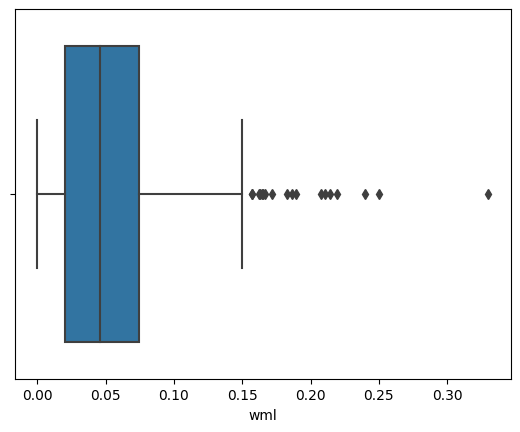

,count,mean,std,min,25%,50%,75%,max
wml,455.0,0.054476,0.045186,0.000007,0.020563,0.046172,0.074257,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



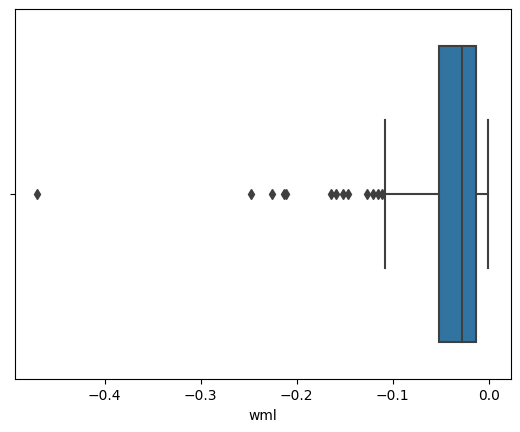

,count,mean,std,min,25%,50%,75%,max
wml,90.0,-0.052091,0.07014,-0.469903,-0.051861,-0.028415,-0.013323,-0.000506



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



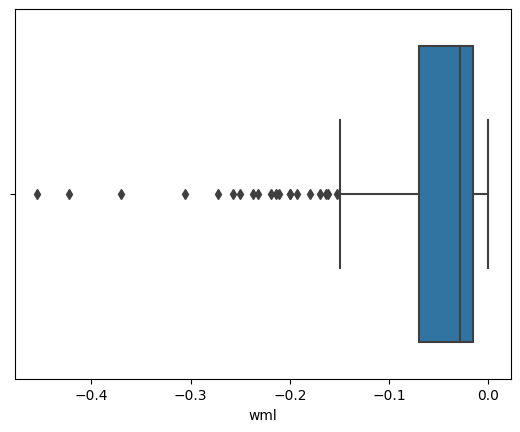

,count,mean,std,min,25%,50%,75%,max
wml,226.0,-0.057992,0.071751,-0.454349,-0.070435,-0.02887,-0.015991,-0.000132



틀린 예측 날짜


19480331, 19490131, 19490630, 19490729, 19490930, 19491231, 19500131, 19500429, 19500630, 
19500929, 19510331, 19510531, 19510629, 19510831, 19520229, 19520430, 19520731, 19521128, 
19530331, 19540129, 19540528, 19540831, 19541231, 19550729, 19551031, 19551230, 19560131, 
19580131, 19580529, 19580630, 19580829, 19581231, 19590731, 19591231, 19600129, 19600729, 
19610131, 19610531, 19610929, 19611229, 19620131, 19620330, 19620731, 19621130, 19630131, 
19640630, 19640731, 19641030, 19650129, 19650226, 19650630, 19651231, 19660531, 19660831, 
19661230, 19670131, 19670731, 19680131, 19680229, 19680628, 19680730, 19681031, 19690228, 
19700831, 19700930, 19701231, 19710730, 19711231, 19721130, 19730731, 19730928, 19740131, 
19750530, 19760227, 19760528, 19760630, 19761029, 19770228, 19770831, 19780428, 19780929, 
19790228, 19790330, 19790731, 19800331, 19800731, 19801231, 19810430, 19810630, 19810731, 
19830131, 19830531, 19830729, 19831031, 19831230, 19840229, 19840831, 19850131

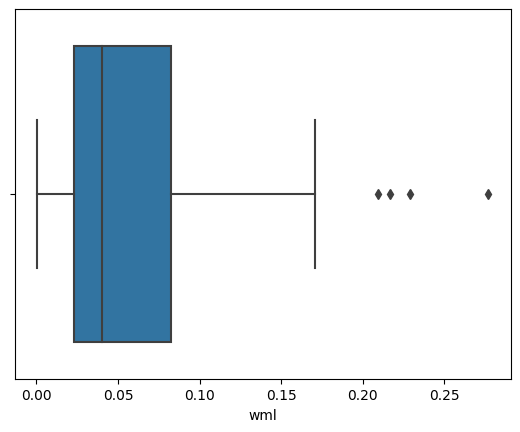

,count,mean,std,min,25%,50%,75%,max
wml,135.0,0.057859,0.052012,0.000577,0.023156,0.040261,0.082452,0.276912



틀린 예측 날짜


19480228, 19480430, 19480528, 19480930, 19490831, 19491031, 19491130, 19500228, 19500531, 
19501031, 19510131, 19511031, 19511231, 19520131, 19520529, 19520630, 19520829, 19520930, 
19530430, 19530630, 19530731, 19540226, 19540331, 19550531, 19560430, 19560531, 19560629, 
19580228, 19581031, 19581128, 19590630, 19620928, 19630430, 19640228, 19651130, 19660131, 
19660429, 19661130, 19670228, 19670331, 19670428, 19670531, 19680430, 19690829, 19691231, 
19700430, 19701030, 19701130, 19710430, 19710528, 19720229, 19730330, 19730629, 19731031, 
19740228, 19750430, 19750630, 19761130, 19761231, 19770331, 19771230, 19800630, 19810227, 
19830228, 19830331, 19830429, 19831130, 19871231, 19880229, 19880729, 19901031, 19910328, 
19911231, 19920331, 19920630, 19960229, 19960531, 19970630, 19971031, 19980331, 19981130, 
19990630, 19990831, 19990930, 20000630, 20010228, 20010531, 20010731, 20011231, 20020531, 
20031031, 20040130, 20040331, 20040930, 20050630, 20050831, 20090130, 20090227

In [63]:
GBC_A0_P1, GBC_A1_P0 = What_Pred(Fixed_GBC_Result, WML, 'GBC')

Sharpe Ratio : 0.67753

최근 누적 수익률

  2022년-12월 -> 12907.30
  2022년-11월 -> 11629.16
  2022년-10월 -> 11629.16
  2022년-09월 -> 10297.36
  2022년-08월 -> 10297.36

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2008년-11월 -> 31201.58
  2등 : 2009년-02월 -> 30463.04
  3등 : 2009년-01월 -> 30463.04
  4등 : 2008년-12월 -> 30463.04
  5등 : 2008년-10월 -> 28453.14
  6등 : 2008년-09월 -> 26861.55
  7등 : 2002년-09월 -> 26063.71
  8등 : 2008년-06월 -> 23943.85
  9등 : 2008년-07월 -> 23943.85
  10등 : 2008년-08월 -> 23943.85



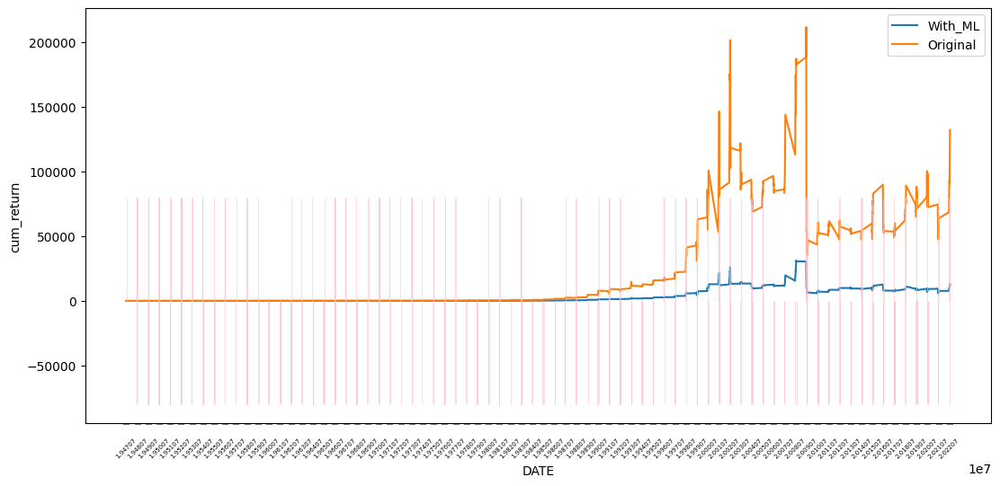

In [64]:
GBC_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_GBC_Result,
                                                 WML,
                                                 'GBC_PRED_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.73463

최근 누적 수익률

  2022년-12월 -> 11375.80
  2022년-11월 -> 10706.72
  2022년-10월 -> 10512.04
  2022년-09월 -> 9590.46
  2022년-08월 -> 9257.37

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 14036.19
  2등 : 2002년-09월 -> 13995.42
  3등 : 2008년-11월 -> 13611.54
  4등 : 2009년-01월 -> 13433.52
  5등 : 2008년-12월 -> 13417.79
  6등 : 2008년-10월 -> 12896.28
  7등 : 2002년-07월 -> 12362.03
  8등 : 2008년-09월 -> 12319.77
  9등 : 2008년-06월 -> 12192.24
  10등 : 2002년-08월 -> 12059.63



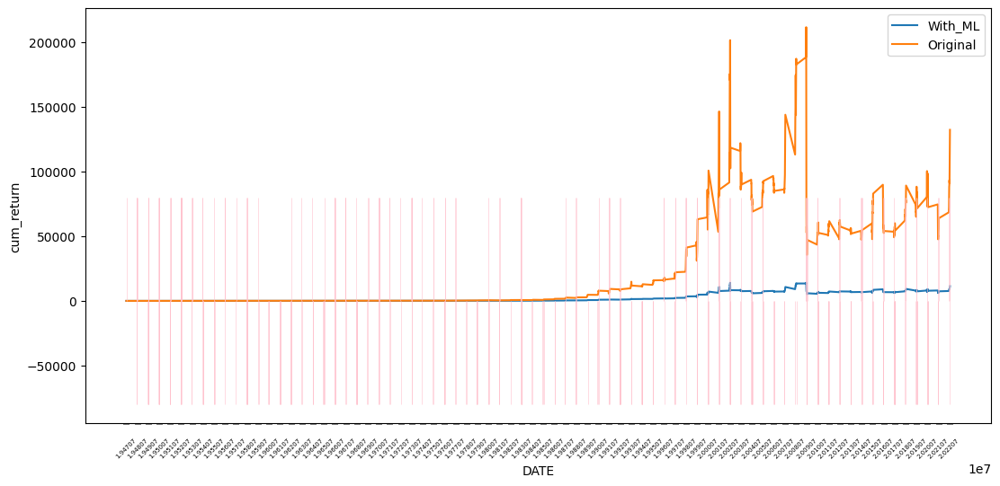

In [67]:
GBC_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_GBC_Result,
                                                 WML,
                                                 'GBC_PROB_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

### XGB

In [69]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

**************************************************

XGB Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : None
 

  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.45      0.34      0.38       316
         1.0       0.69      0.78      0.73       590

    accuracy                           0.62       906
   macro avg       0.57      0.56      0.56       906
weighted avg       0.60      0.62      0.61       906


accuracy : 0.6236203090507726

precision : 0.6860986547085202

recall : 0.7779661016949152

F1-Score : 0.7291501191421762



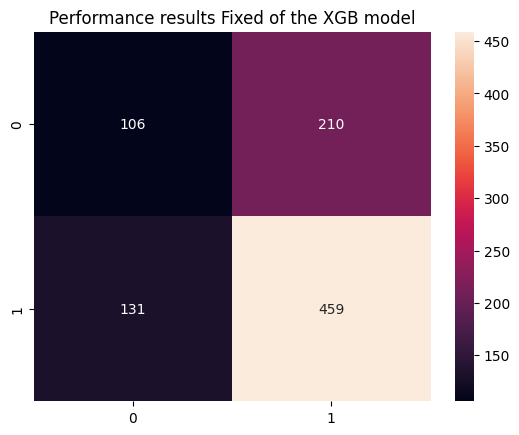


Feature Importance of the model



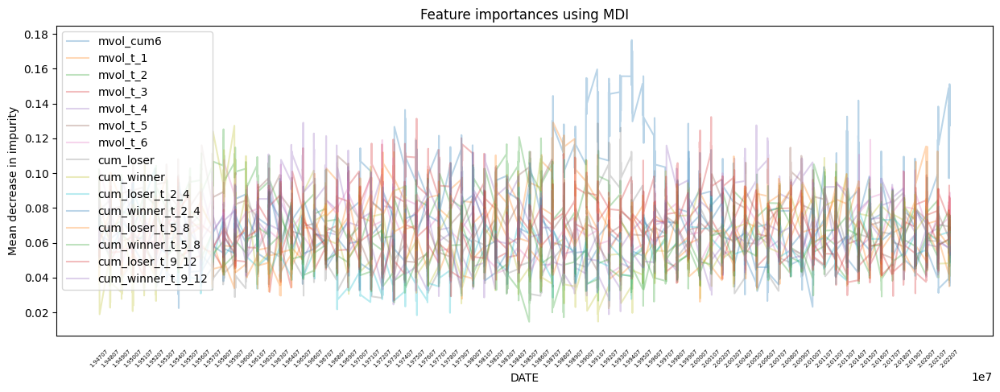

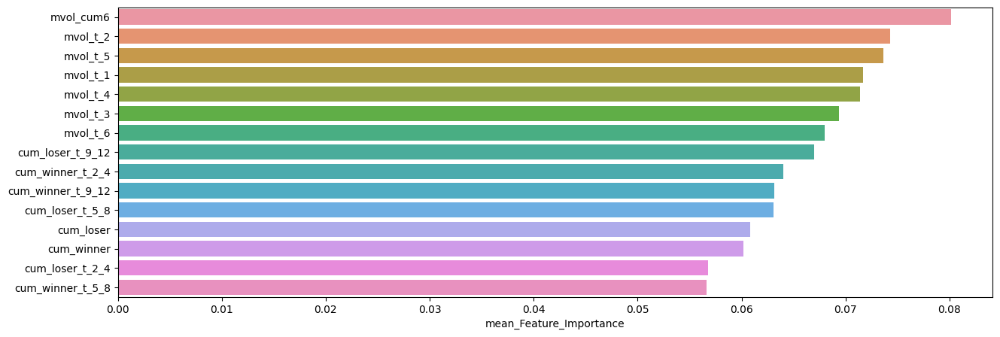

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.080129,0.176483,0.022431
mvol_t_2,0.074252,0.125240,0.029076
mvol_t_5,0.073616,0.116040,0.037315
mvol_t_1,0.071667,0.129146,0.034166
mvol_t_4,0.071407,0.127518,0.030859
mvol_t_3,0.069344,0.131351,0.031665
mvol_t_6,0.068015,0.119199,0.035734
cum_loser_t_9_12,0.066968,0.132292,0.026936
cum_winner_t_2_4,0.064039,0.128505,0.031194
cum_winner_t_9_12,0.063124,0.129001,0.018914


In [70]:
Fixed_XGB_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=XGB, # 사용할 모델
                                  model_name='XGB', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.37      0.40        75
         1.0       0.71      0.75      0.73       151

    accuracy                           0.62       226
   macro avg       0.57      0.56      0.56       226
weighted avg       0.61      0.62      0.62       226


accuracy : 0.6238938053097345

precision : 0.70625

recall : 0.7483443708609272

F1-Score : 0.7266881028938906



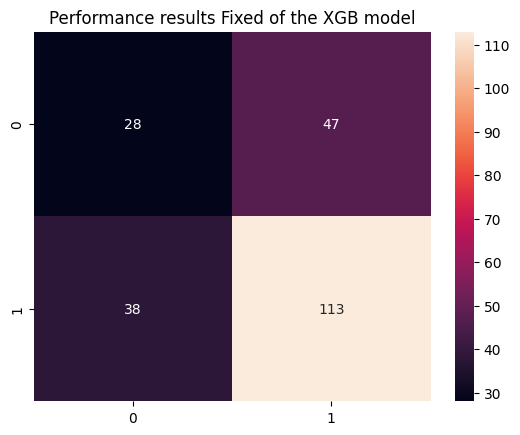


Feature Importance of the model



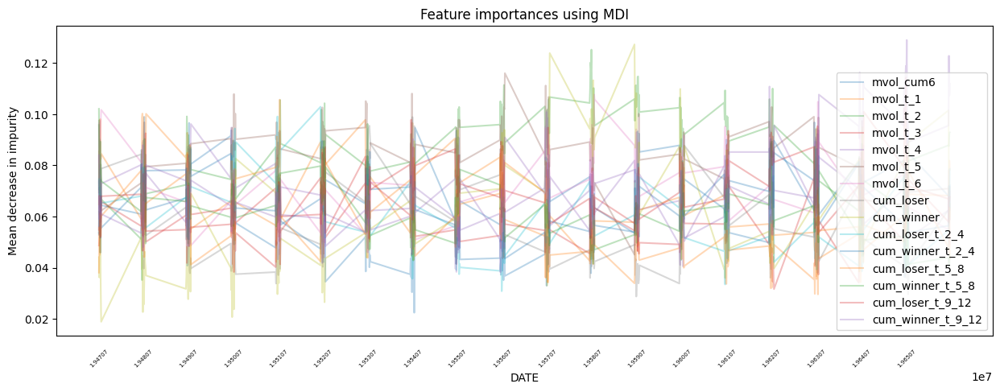

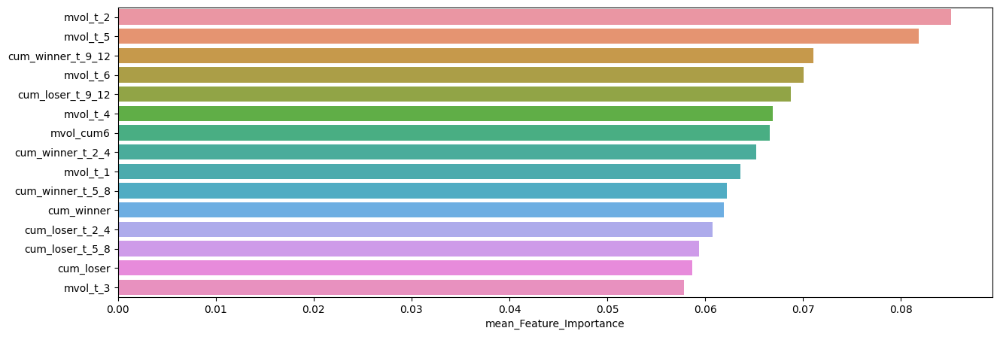

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.085103,0.125240,0.035160
mvol_t_5,0.081816,0.116040,0.045121
cum_winner_t_9_12,0.071055,0.129001,0.038281
mvol_t_6,0.070076,0.107671,0.043727
cum_loser_t_9_12,0.068784,0.114385,0.038312
mvol_t_4,0.066939,0.096180,0.040596
mvol_cum6,0.066600,0.098978,0.022431
cum_winner_t_2_4,0.065198,0.090364,0.032966
mvol_t_1,0.063587,0.100259,0.034166
cum_winner_t_5_8,0.062234,0.102114,0.039119



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.49      0.37      0.42        75
         1.0       0.72      0.81      0.76       151

    accuracy                           0.66       226
   macro avg       0.61      0.59      0.59       226
weighted avg       0.65      0.66      0.65       226


accuracy : 0.6637168141592921

precision : 0.7218934911242604

recall : 0.8079470198675497

F1-Score : 0.7625



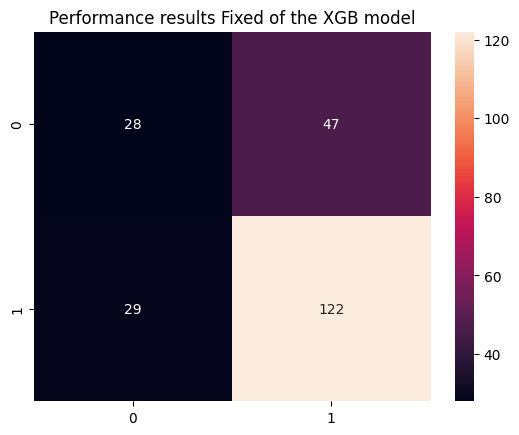


Feature Importance of the model



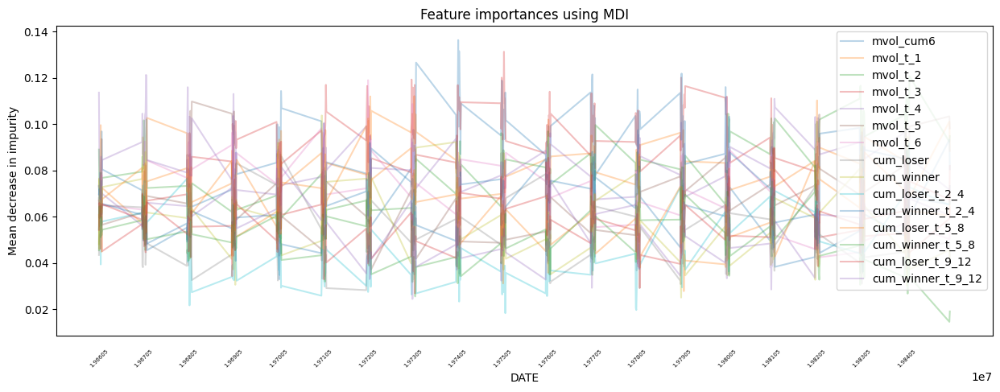

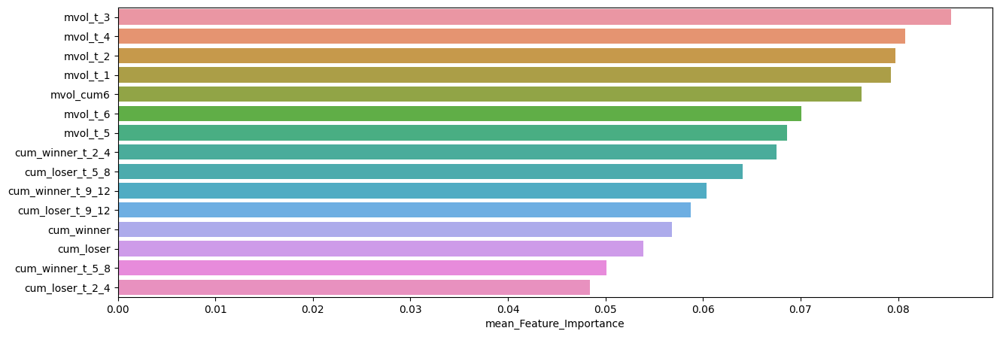

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_3,0.085418,0.131351,0.042505
mvol_t_4,0.080732,0.113088,0.055454
mvol_t_2,0.079738,0.120786,0.045445
mvol_t_1,0.079258,0.112165,0.048026
mvol_cum6,0.076266,0.136355,0.036261
mvol_t_6,0.070114,0.119043,0.037603
mvol_t_5,0.068612,0.109840,0.037315
cum_winner_t_2_4,0.067529,0.121895,0.032990
cum_loser_t_5_8,0.064039,0.110295,0.027859
cum_winner_t_9_12,0.060377,0.121342,0.024504



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.33      0.20      0.25        70
         1.0       0.69      0.81      0.75       156

    accuracy                           0.62       226
   macro avg       0.51      0.51      0.50       226
weighted avg       0.58      0.62      0.59       226


accuracy : 0.6238938053097345

precision : 0.6939890710382514

recall : 0.8141025641025641

F1-Score : 0.7492625368731564



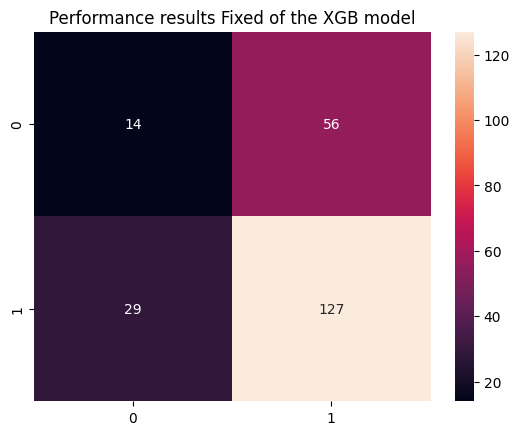


Feature Importance of the model



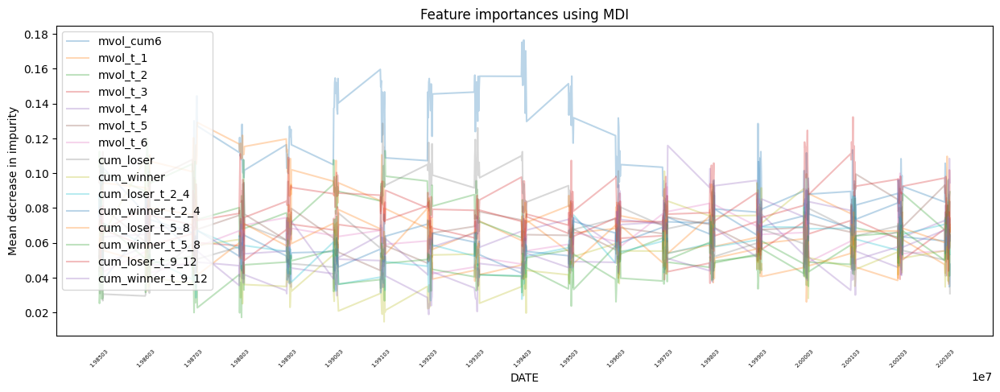

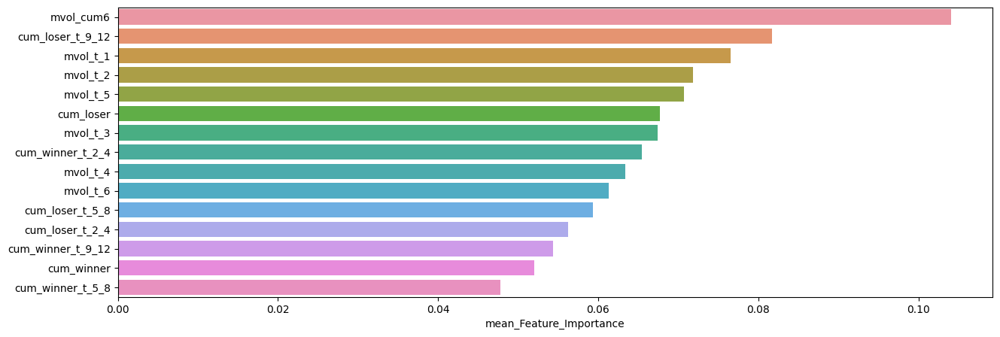

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.104063,0.176483,0.034810
cum_loser_t_9_12,0.081747,0.132292,0.042535
mvol_t_1,0.076545,0.129146,0.036357
mvol_t_2,0.071865,0.120041,0.033211
mvol_t_5,0.070725,0.112281,0.044180
cum_loser,0.067729,0.128618,0.026809
mvol_t_3,0.067419,0.101857,0.036823
cum_winner_t_2_4,0.065479,0.128505,0.036580
mvol_t_4,0.063405,0.115899,0.030859
mvol_t_6,0.061292,0.099952,0.035734



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.51      0.38      0.43        96
         1.0       0.62      0.73      0.67       132

    accuracy                           0.58       228
   macro avg       0.56      0.55      0.55       228
weighted avg       0.57      0.58      0.57       228


accuracy : 0.5833333333333334

precision : 0.6178343949044586

recall : 0.7348484848484849

F1-Score : 0.671280276816609



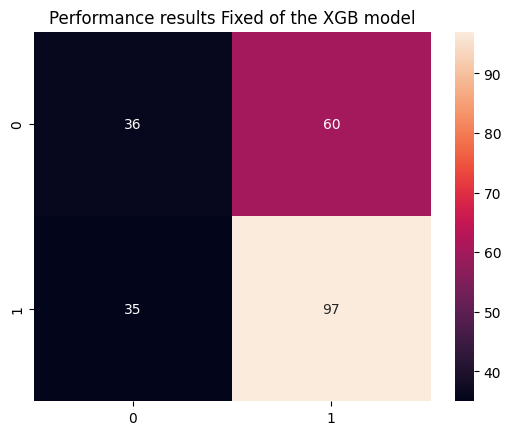


Feature Importance of the model



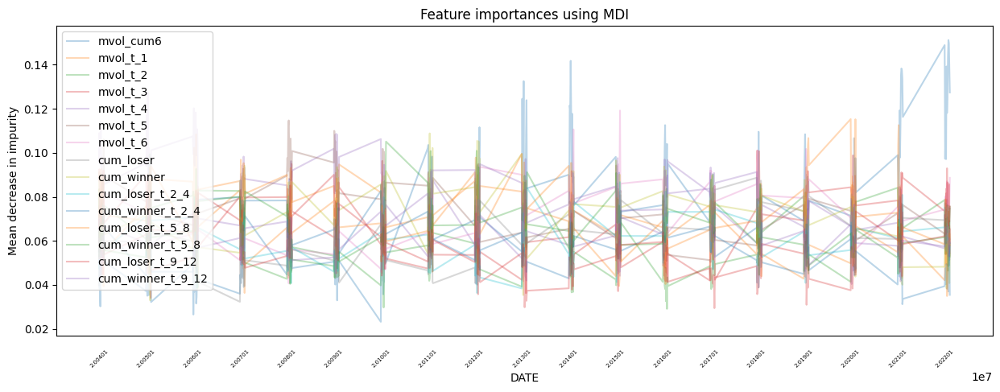

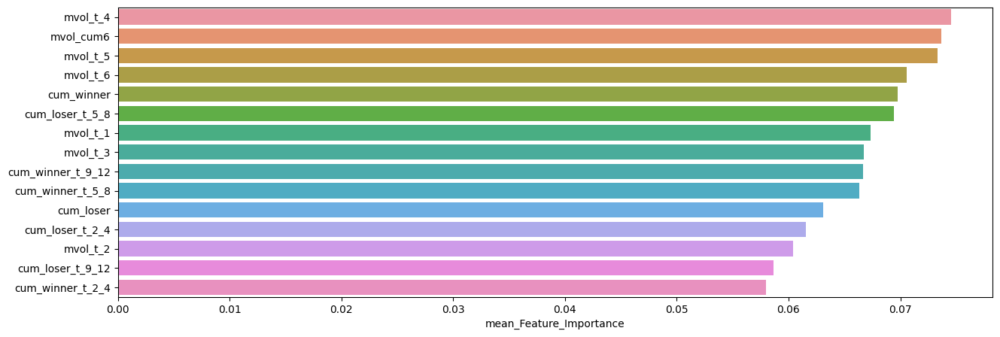

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_4,0.074525,0.127518,0.040380
mvol_cum6,0.073647,0.151193,0.023195
mvol_t_5,0.073314,0.114700,0.045653
mvol_t_6,0.070556,0.119199,0.040651
cum_winner,0.069757,0.108820,0.032953
cum_loser_t_5_8,0.069442,0.115314,0.034928
mvol_t_1,0.067316,0.108415,0.036317
mvol_t_3,0.066719,0.101003,0.034095
cum_winner_t_9_12,0.066700,0.097609,0.041621
cum_winner_t_5_8,0.066325,0.105091,0.040402


In [71]:
slice_feature_importance(Fixed_XGB_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'XGB') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



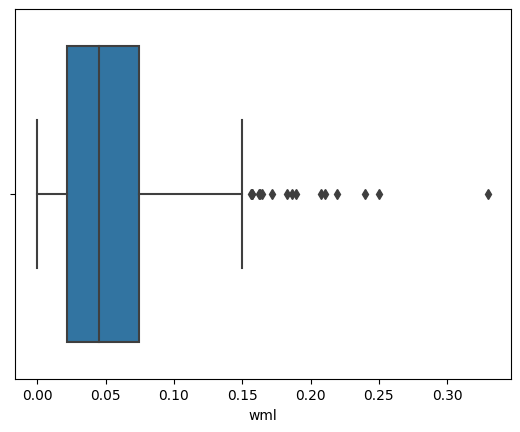

,count,mean,std,min,25%,50%,75%,max
wml,459.0,0.054105,0.044242,0.000007,0.021986,0.045141,0.074723,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



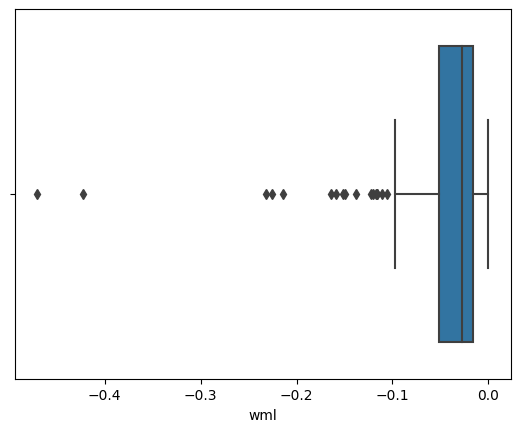

,count,mean,std,min,25%,50%,75%,max
wml,106.0,-0.053079,0.073413,-0.469903,-0.051894,-0.028053,-0.015905,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



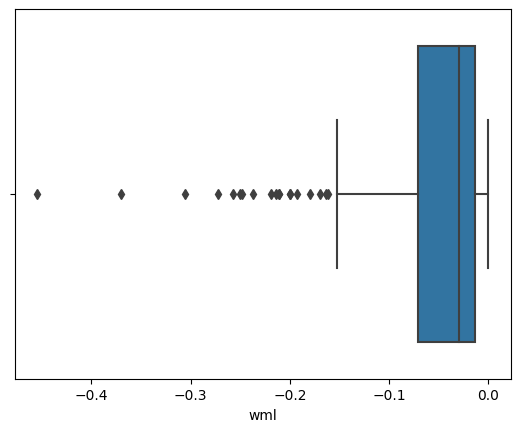

,count,mean,std,min,25%,50%,75%,max
wml,210.0,-0.057942,0.070231,-0.454349,-0.07091,-0.029177,-0.013948,-0.000132



틀린 예측 날짜


19490131, 19490630, 19490729, 19491231, 19500131, 19500429, 19500630, 19500929, 19510531, 
19510831, 19510928, 19520229, 19520731, 19521128, 19530227, 19530331, 19540528, 19540831, 
19550729, 19551031, 19551230, 19560131, 19570131, 19580131, 19580529, 19580630, 19580829, 
19590731, 19591231, 19600930, 19610131, 19610531, 19610929, 19611229, 19620131, 19620330, 
19621130, 19630628, 19641030, 19650129, 19650226, 19650630, 19660531, 19660831, 19661031, 
19670731, 19680131, 19680229, 19680628, 19680730, 19681031, 19690228, 19691031, 19700831, 
19710331, 19710730, 19711231, 19720831, 19721130, 19730731, 19740131, 19740329, 19750131, 
19750530, 19760528, 19760630, 19761029, 19770831, 19780428, 19780929, 19781031, 19790131, 
19800331, 19800731, 19801231, 19810430, 19810831, 19820831, 19830131, 19830531, 19830729, 
19831230, 19840831, 19850131, 19850731, 19851129, 19860829, 19870227, 19870529, 19880129, 
19880630, 19881230, 19891229, 19900131, 19900228, 19901130, 19910430, 19910628

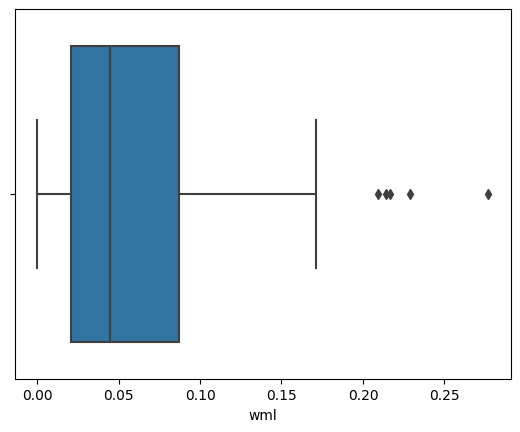

,count,mean,std,min,25%,50%,75%,max
wml,131.0,0.059262,0.054877,0.000221,0.021107,0.04498,0.086956,0.276912



틀린 예측 날짜


19480228, 19480430, 19480528, 19490531, 19490831, 19491031, 19491130, 19500531, 19501031, 
19520529, 19530630, 19530731, 19540226, 19540331, 19550228, 19560430, 19560531, 19560629, 
19570731, 19580228, 19581031, 19590630, 19590831, 19600429, 19610731, 19620228, 19620928, 
19630228, 19631031, 19631129, 19640228, 19651130, 19660131, 19660228, 19661130, 19670331, 
19680329, 19680430, 19690829, 19700227, 19700331, 19700430, 19701030, 19710430, 19710930, 
19730330, 19731031, 19740228, 19741031, 19761130, 19770131, 19771130, 19771230, 19800630, 
19810529, 19830228, 19830331, 19830429, 19831130, 19840928, 19880729, 19910328, 19910531, 
19911231, 19920331, 19920630, 19920731, 19951031, 19951229, 19960531, 19970131, 19970430, 
19980227, 19980331, 19981130, 19990129, 19990630, 19990831, 19990930, 19991029, 20000630, 
20010228, 20010531, 20011231, 20020731, 20030228, 20040130, 20040331, 20040930, 20041130, 
20061229, 20070330, 20080930, 20081128, 20090130, 20090227, 20090630, 20091030

In [72]:
XGB_A0_P1, XGB_A1_P0 = What_Pred(Fixed_XGB_Result, WML, 'XGB')

Sharpe Ratio : 0.71843

최근 누적 수익률

  2022년-12월 -> 39839.13
  2022년-11월 -> 35894.26
  2022년-10월 -> 35894.26
  2022년-09월 -> 31783.80
  2022년-08월 -> 31783.80

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2008년-10월 -> 78188.78
  2등 : 2008년-11월 -> 78188.78
  3등 : 2009년-02월 -> 76338.10
  4등 : 2009년-01월 -> 76338.10
  5등 : 2008년-12월 -> 76338.10
  6등 : 2009년-03월 -> 76338.10
  7등 : 2008년-08월 -> 73815.21
  8등 : 2008년-09월 -> 73815.21
  9등 : 2008년-07월 -> 73815.21
  10등 : 2008년-06월 -> 73815.21



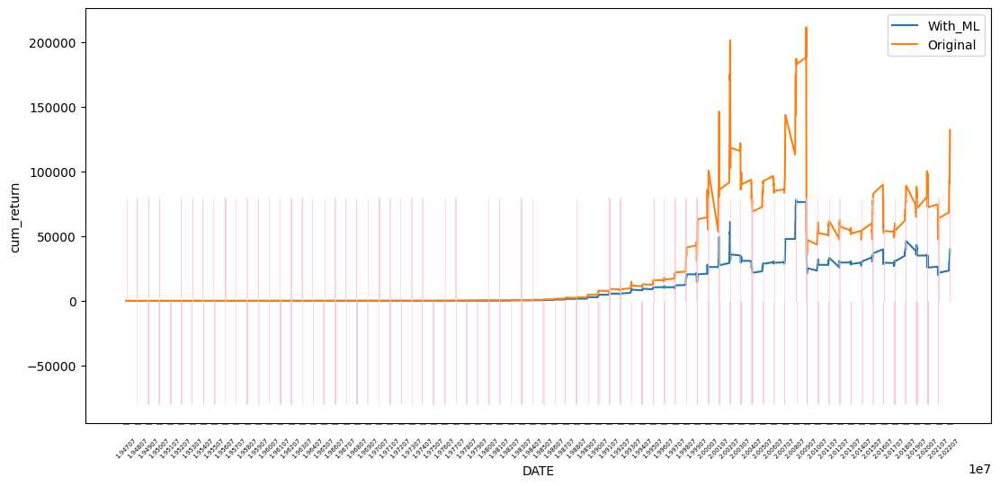

In [73]:
XGB_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_XGB_Result,
                                                 WML,
                                                 'XGB_PRED_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.72231

최근 누적 수익률

  2022년-12월 -> 31696.21
  2022년-11월 -> 29197.29
  2022년-10월 -> 29180.74
  2022년-09월 -> 26428.75
  2022년-08월 -> 25494.26

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 46808.78
  2등 : 2008년-11월 -> 44999.35
  3등 : 2009년-01월 -> 44112.20
  4등 : 2008년-12월 -> 44018.21
  5등 : 2008년-10월 -> 43622.95
  6등 : 2008년-06월 -> 42728.18
  7등 : 2008년-09월 -> 41472.45
  8등 : 2008년-07월 -> 41328.51
  9등 : 2008년-08월 -> 41255.73
  10등 : 2009년-03월 -> 40803.86



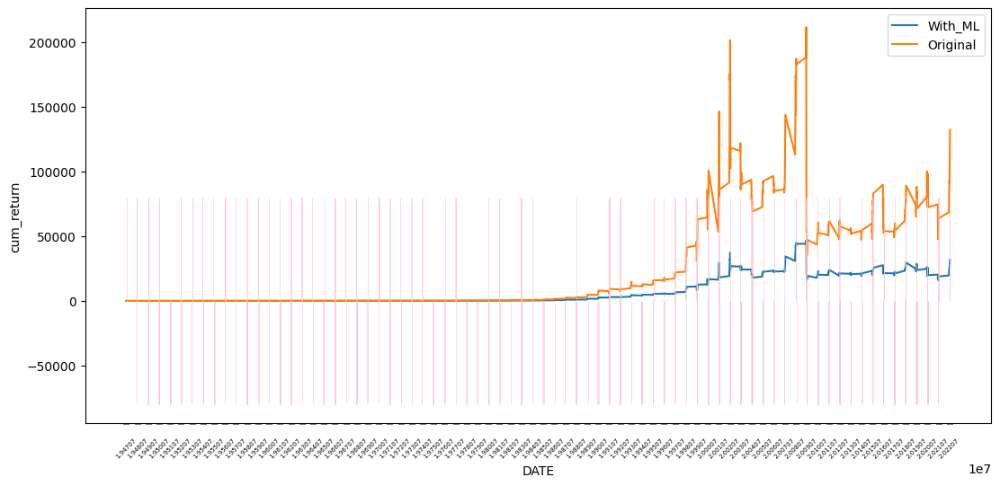

In [74]:
XGB_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_XGB_Result,
                                                 WML,
                                                 'XGB_PROB_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

### LGBM

In [75]:
LGBM_param = {}
LGBM = LGBMClassifier(**LGBM_param, random_state=42)

**************************************************

LGBM Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   boosting_type : gbdt
   class_weight : None
   colsample_bytree : 1.0
   importance_type : split
   learning_rate : 0.1
   max_depth : -1
   min_child_samples : 20
   min_child_weight : 0.001
   min_split_gain : 0.0
   n_estimators : 100
   n_jobs : -1
   num_leaves : 31
   objective : None
   random_state : 42
   reg_alpha : 0.0
   reg_lambda : 0.0
   silent : warn
   subsample : 1.0
   subsample_for_bin : 200000
   subsample_freq : 0

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.32      0.36       316
         1.0       0.68      0.77      0.72       590

    accuracy                           0.61       906
   macro avg       0.55      0.54      0.54       906
weighted avg       0.59      0.61      0.59       906


accuracy : 0.609271523178808

precision : 0.6766467065868264

recall : 0.7661016949152543

F1-Score : 0.7186009538950715



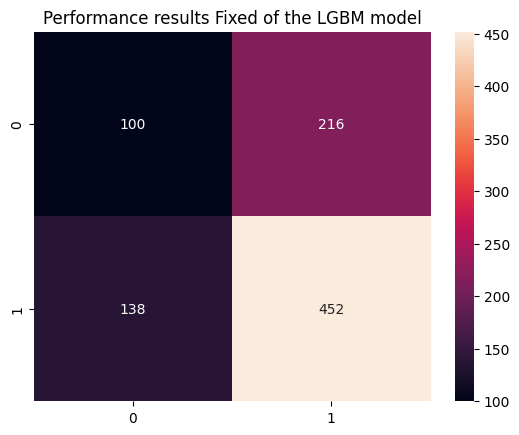


Feature Importance of the model



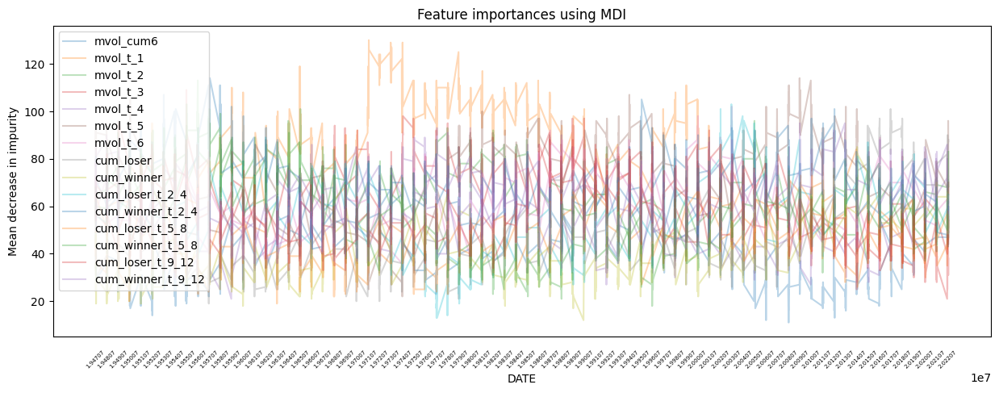

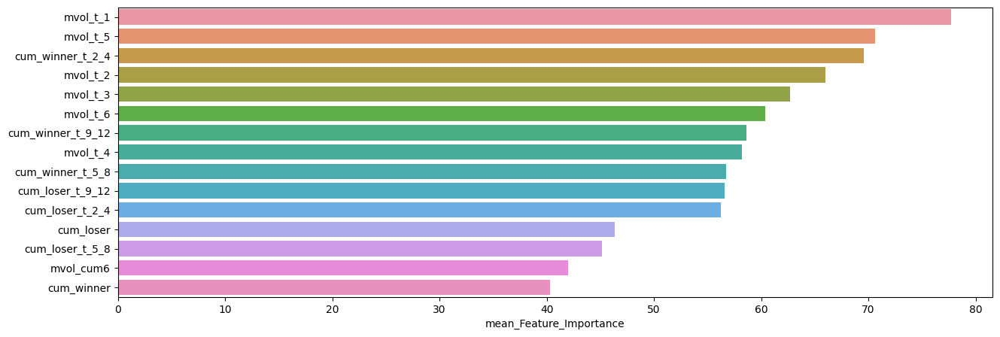

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,77.695364,130,36
mvol_t_5,70.626932,114,22
cum_winner_t_2_4,69.564018,114,35
mvol_t_2,66.003311,97,32
mvol_t_3,62.689845,109,33
mvol_t_6,60.383002,102,32
cum_winner_t_9_12,58.593819,95,29
mvol_t_4,58.176600,93,21
cum_winner_t_5_8,56.742826,113,18
cum_loser_t_9_12,56.588300,95,21


In [76]:
Fixed_LGBM_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                    window_size=240, # window size (훈련 데이터 셋 크기)
                                    method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                    model=LGBM, # 사용할 모델
                                    model_name='LGBM', # 사용한 모델 명
                                    plot=True, # 모델 성능 지표 시각화 여부
                                    plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.33      0.36        75
         1.0       0.69      0.74      0.72       151

    accuracy                           0.61       226
   macro avg       0.54      0.54      0.54       226
weighted avg       0.59      0.61      0.60       226


accuracy : 0.6061946902654868

precision : 0.691358024691358

recall : 0.7417218543046358

F1-Score : 0.7156549520766773



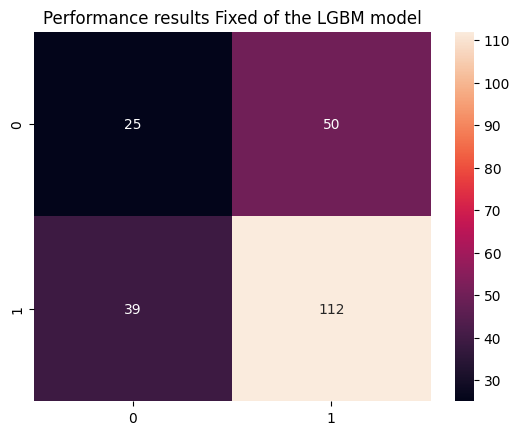


Feature Importance of the model



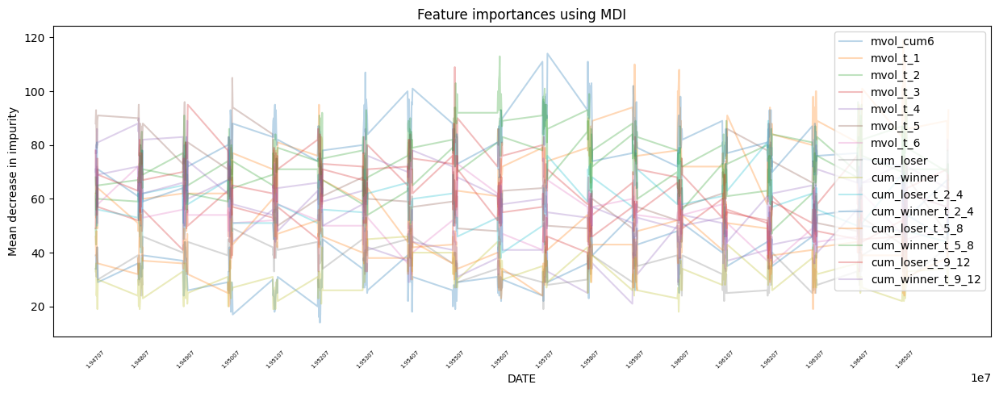

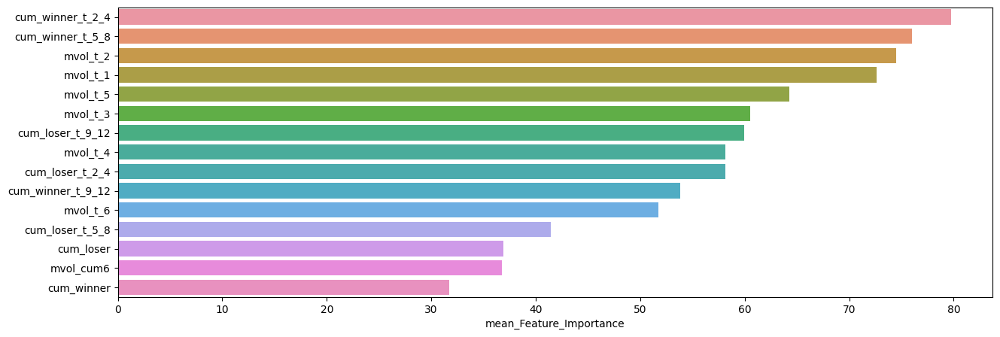

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_2_4,79.734513,114,45
cum_winner_t_5_8,76.022124,113,46
mvol_t_2,74.522124,97,43
mvol_t_1,72.588496,119,42
mvol_t_5,64.252212,105,34
mvol_t_3,60.522124,109,33
cum_loser_t_9_12,59.915929,95,33
mvol_t_4,58.137168,90,21
cum_loser_t_2_4,58.119469,89,38
cum_winner_t_9_12,53.831858,89,29



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.43      0.33      0.38        75
         1.0       0.70      0.78      0.74       151

    accuracy                           0.63       226
   macro avg       0.57      0.56      0.56       226
weighted avg       0.61      0.63      0.62       226


accuracy : 0.6327433628318584

precision : 0.7023809523809523

recall : 0.7814569536423841

F1-Score : 0.7398119122257053



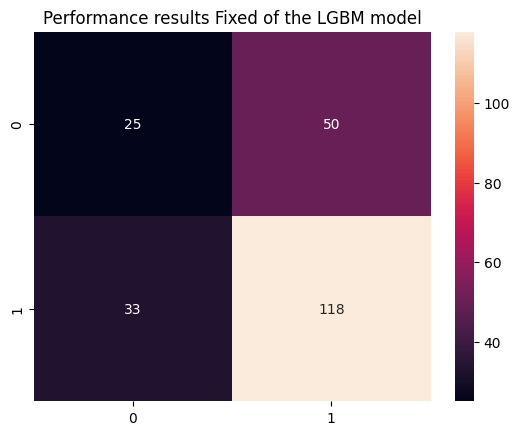


Feature Importance of the model



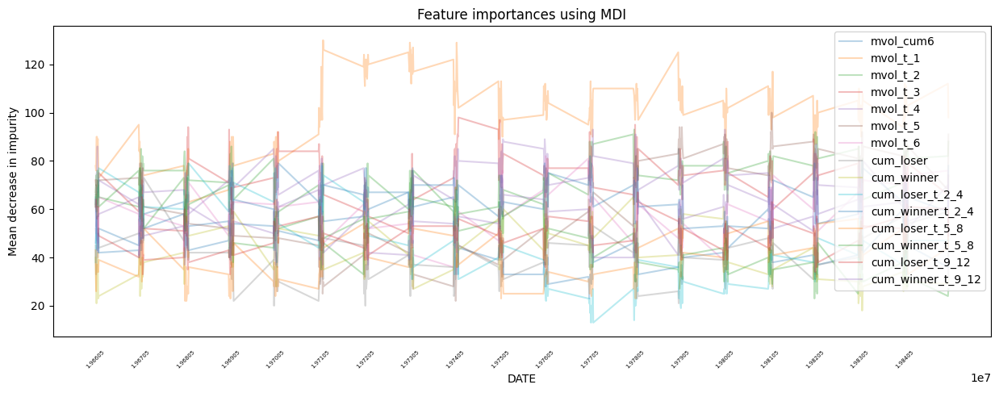

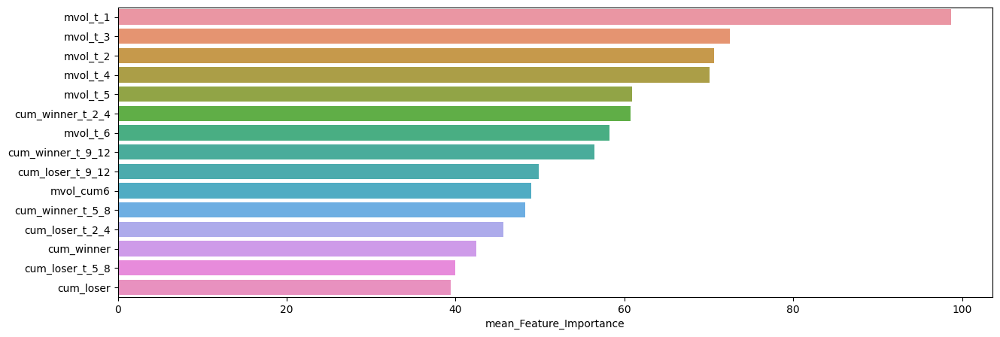

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,98.672566,130,57
mvol_t_3,72.486726,98,50
mvol_t_2,70.619469,93,43
mvol_t_4,70.115044,93,45
mvol_t_5,60.942478,100,22
cum_winner_t_2_4,60.699115,82,35
mvol_t_6,58.269912,82,34
cum_winner_t_9_12,56.477876,87,36
cum_loser_t_9_12,49.840708,69,33
mvol_cum6,48.929204,79,23



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.21      0.26        70
         1.0       0.70      0.81      0.75       156

    accuracy                           0.63       226
   macro avg       0.52      0.51      0.51       226
weighted avg       0.59      0.63      0.60       226


accuracy : 0.6283185840707964

precision : 0.6978021978021978

recall : 0.8141025641025641

F1-Score : 0.7514792899408284



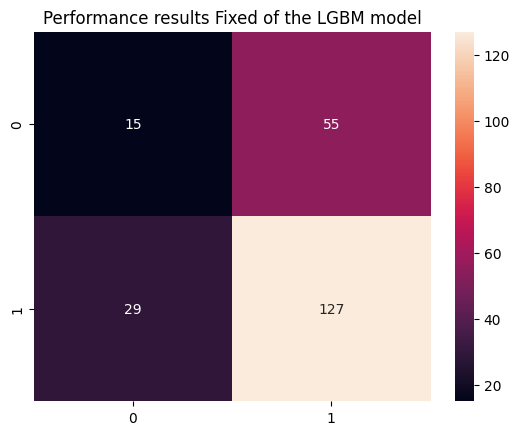


Feature Importance of the model



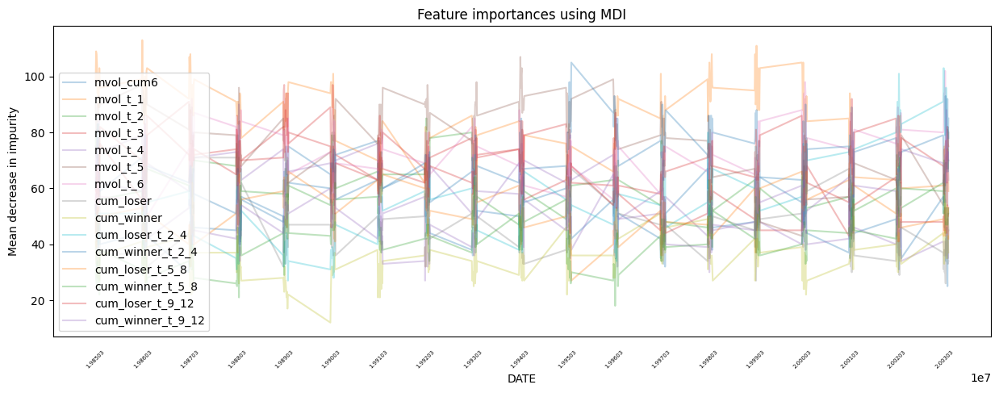

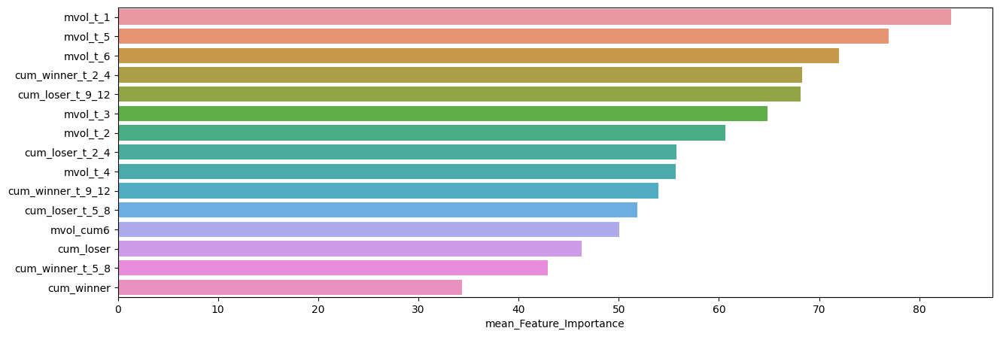

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,83.150442,113,55
mvol_t_5,76.929204,107,43
mvol_t_6,71.960177,102,45
cum_winner_t_2_4,68.274336,105,37
cum_loser_t_9_12,68.172566,92,44
mvol_t_3,64.840708,97,40
mvol_t_2,60.610619,85,39
cum_loser_t_2_4,55.769912,103,27
mvol_t_4,55.672566,90,27
cum_winner_t_9_12,53.960177,88,30



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.49      0.36      0.42        96
         1.0       0.61      0.72      0.66       132

    accuracy                           0.57       228
   macro avg       0.55      0.54      0.54       228
weighted avg       0.56      0.57      0.56       228


accuracy : 0.5701754385964912

precision : 0.6089743589743589

recall : 0.7196969696969697

F1-Score : 0.6597222222222222



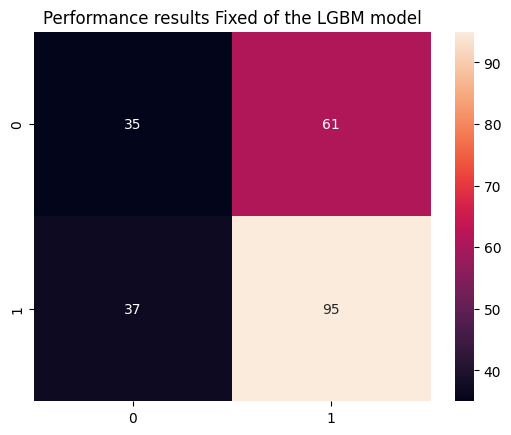


Feature Importance of the model



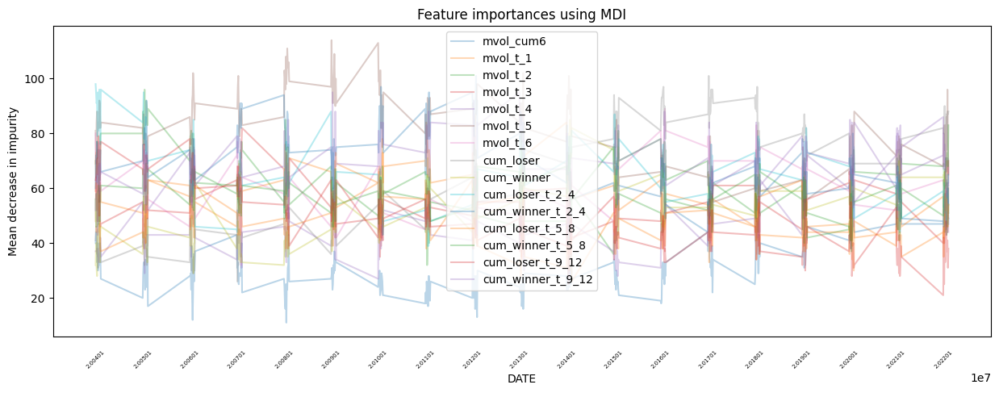

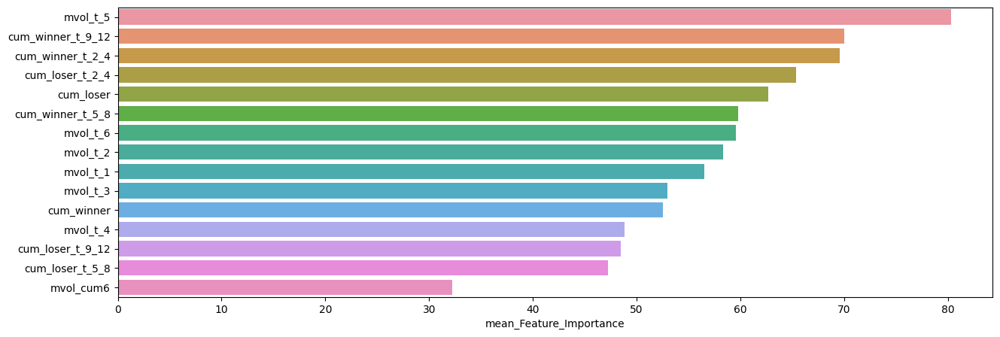

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,80.298246,114,50
cum_winner_t_9_12,70.004386,95,43
cum_winner_t_2_4,69.548246,101,43
cum_loser_t_2_4,65.385965,98,39
cum_loser,62.728070,101,26
cum_winner_t_5_8,59.789474,83,37
mvol_t_6,59.605263,89,32
mvol_t_2,58.328947,96,32
mvol_t_1,56.557018,84,36
mvol_t_3,52.995614,82,34


In [77]:
slice_feature_importance(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                        4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                        'Fixed', # Rolling Windows Method
                        'LGBM') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



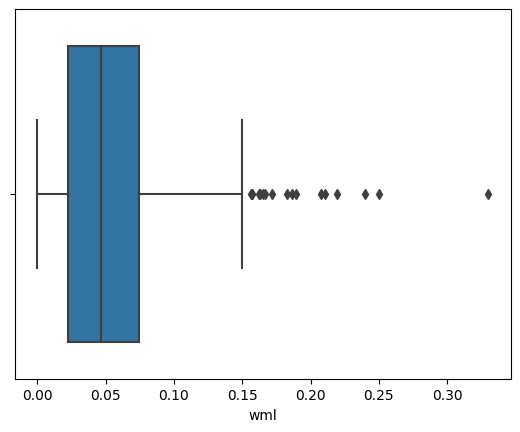

,count,mean,std,min,25%,50%,75%,max
wml,452.0,0.05517,0.045236,0.000007,0.022305,0.04627,0.074563,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



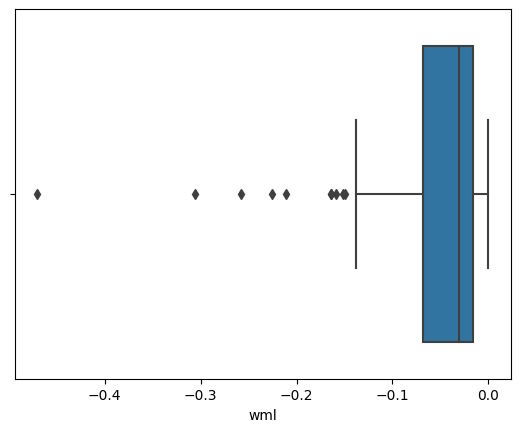

,count,mean,std,min,25%,50%,75%,max
wml,100.0,-0.056971,0.071389,-0.469903,-0.068119,-0.03107,-0.015868,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



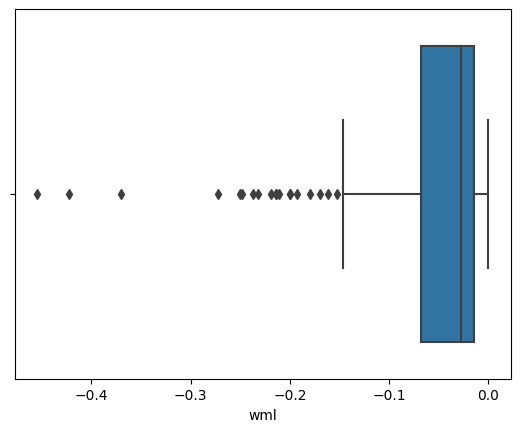

,count,mean,std,min,25%,50%,75%,max
wml,216.0,-0.056005,0.071327,-0.454349,-0.06782,-0.027285,-0.014118,-0.000132



틀린 예측 날짜


19490729, 19491231, 19500131, 19500429, 19500630, 19500731, 19500929, 19510331, 19510531, 
19510831, 19520229, 19520731, 19521128, 19530227, 19530331, 19540129, 19540528, 19541231, 
19551031, 19551230, 19560131, 19570131, 19580529, 19580630, 19580829, 19581231, 19590529, 
19591231, 19600129, 19600729, 19600930, 19610131, 19610531, 19610929, 19611229, 19620131, 
19620731, 19621130, 19630628, 19640630, 19640731, 19641030, 19650129, 19650226, 19650630, 
19660831, 19660930, 19661230, 19670731, 19680131, 19680229, 19680628, 19680730, 19681031, 
19691031, 19700831, 19700930, 19701231, 19710226, 19710331, 19711231, 19720831, 19721130, 
19740131, 19740329, 19750131, 19750228, 19750530, 19760227, 19760528, 19760630, 19761029, 
19780428, 19780929, 19781031, 19790131, 19790228, 19790731, 19800331, 19800731, 19801231, 
19810430, 19810831, 19820831, 19830131, 19830531, 19830729, 19831230, 19840831, 19850131, 
19860829, 19860930, 19870227, 19870529, 19880129, 19880331, 19880630, 19881230

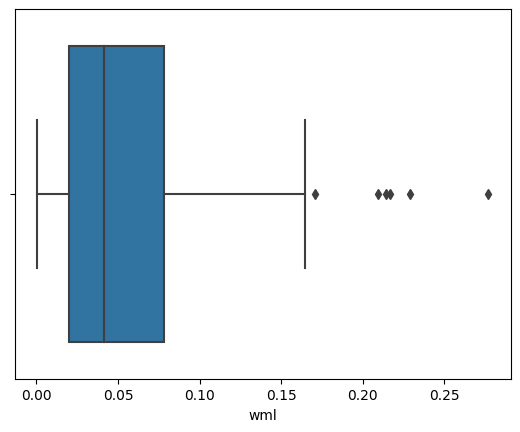

,count,mean,std,min,25%,50%,75%,max
wml,138.0,0.055512,0.051812,0.000577,0.019858,0.041639,0.078324,0.276912



틀린 예측 날짜


19480528, 19481130, 19490531, 19490831, 19491031, 19491130, 19500531, 19520131, 19520529, 
19530130, 19530630, 19530731, 19540226, 19540331, 19550531, 19560430, 19560629, 19560731, 
19570731, 19570930, 19580228, 19581031, 19590630, 19590831, 19610731, 19610831, 19620228, 
19630228, 19631129, 19640131, 19640228, 19641130, 19660131, 19660228, 19660331, 19661130, 
19680329, 19680430, 19681129, 19690430, 19690829, 19700227, 19700331, 19700430, 19701030, 
19710930, 19720229, 19730330, 19730629, 19731031, 19740228, 19750430, 19760730, 19761130, 
19771130, 19771230, 19790629, 19800630, 19810227, 19810529, 19830228, 19830331, 19830429, 
19840928, 19850628, 19870831, 19880729, 19910328, 19910531, 19911231, 19920630, 19940729, 
19951229, 19960531, 19970630, 19970731, 19980331, 19980430, 19981130, 19990129, 19990630, 
19990930, 20000630, 20000831, 20000929, 20001229, 20010228, 20010531, 20011231, 20020531, 
20040130, 20040331, 20040528, 20040630, 20041130, 20050630, 20050930, 20051230

In [78]:
LGBM_A0_P1, LGBM_A1_P0 = What_Pred(Fixed_LGBM_Result,
                                   WML,
                                   'LGBM')

Sharpe Ratio : 0.70477

최근 누적 수익률

  2022년-12월 -> 44429.46
  2022년-11월 -> 44429.46
  2022년-10월 -> 44429.46
  2022년-09월 -> 39341.61
  2022년-08월 -> 39341.61

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 73121.80
  2등 : 2002년-09월 -> 72394.74
  3등 : 2008년-11월 -> 66688.46
  4등 : 2009년-01월 -> 65109.98
  5등 : 2008년-12월 -> 65109.98
  6등 : 2002년-07월 -> 63040.36
  7등 : 2002년-06월 -> 63040.36
  8등 : 2002년-08월 -> 61214.00
  9등 : 2008년-10월 -> 60814.21
  10등 : 2002년-10월 -> 58411.75



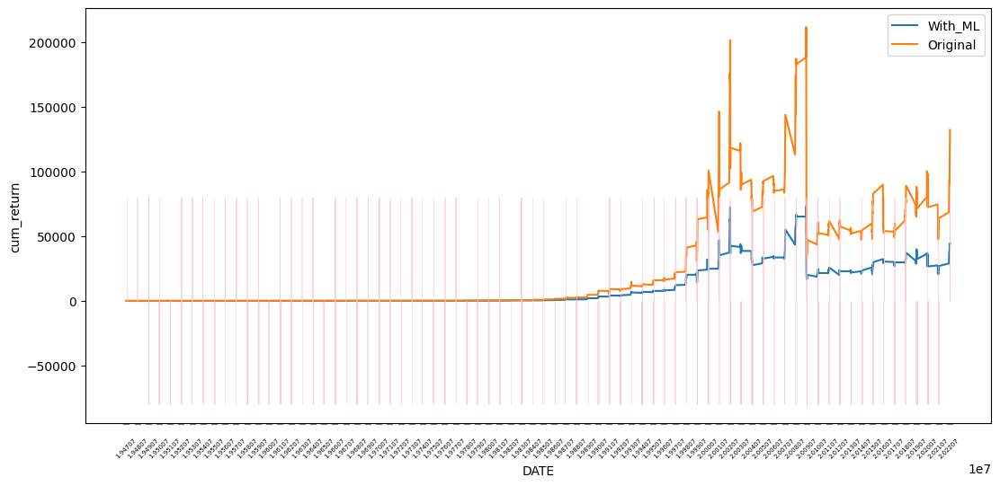

In [79]:
LGBM_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PRED_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

Sharpe Ratio : 0.74486

최근 누적 수익률

  2022년-12월 -> 24406.50
  2022년-11월 -> 23454.42
  2022년-10월 -> 23330.15
  2022년-09월 -> 21717.97
  2022년-08월 -> 21237.49

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 29979.34
  2등 : 2008년-11월 -> 28666.73
  3등 : 2002년-09월 -> 28636.80
  4등 : 2009년-01월 -> 28200.40
  5등 : 2008년-12월 -> 28061.47
  6등 : 2008년-10월 -> 26944.06
  7등 : 2008년-06월 -> 26063.75
  8등 : 2008년-09월 -> 25959.72
  9등 : 2008년-07월 -> 25333.63
  10등 : 2008년-08월 -> 25247.00



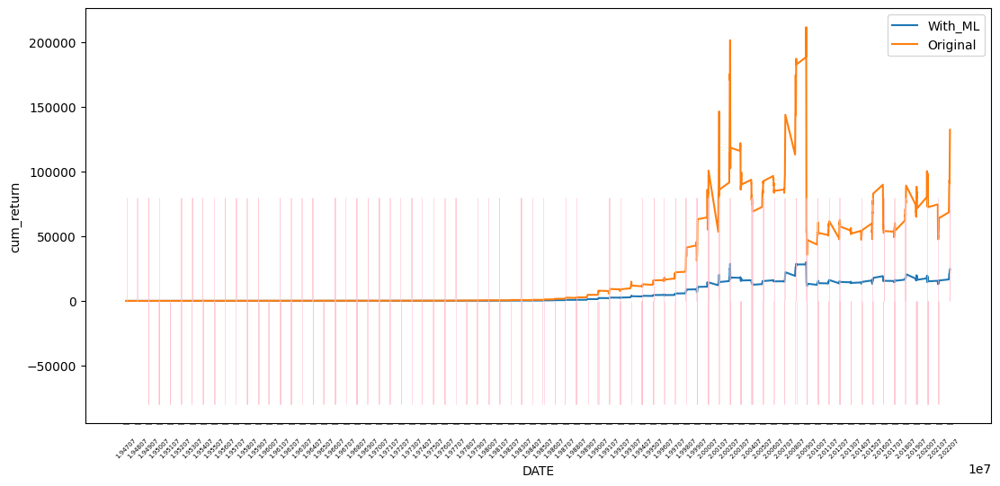

In [80]:
LGBM_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PROB_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

## Rolling Expanding Windows

### Random Forest

In [81]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

**************************************************

RDF Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.18      0.25       316
         1.0       0.66      0.86      0.75       590

    accuracy                           0.62       906
   macro avg       0.54      0.52      0.50       906
weighted avg       0.57      0.62      0.57       906


accuracy : 0.6236203090507726

precision : 0.6618985695708712

recall : 0.8627118644067797

F1-Score : 0.7490802060338485



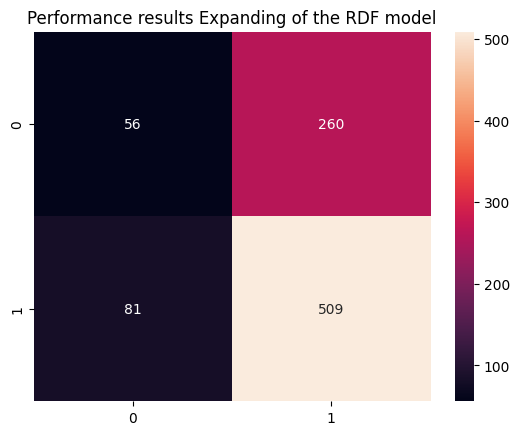


Feature Importance of the model



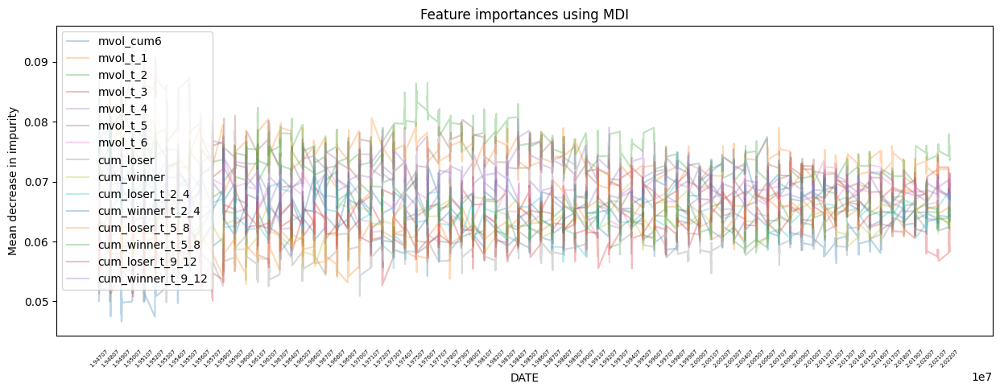

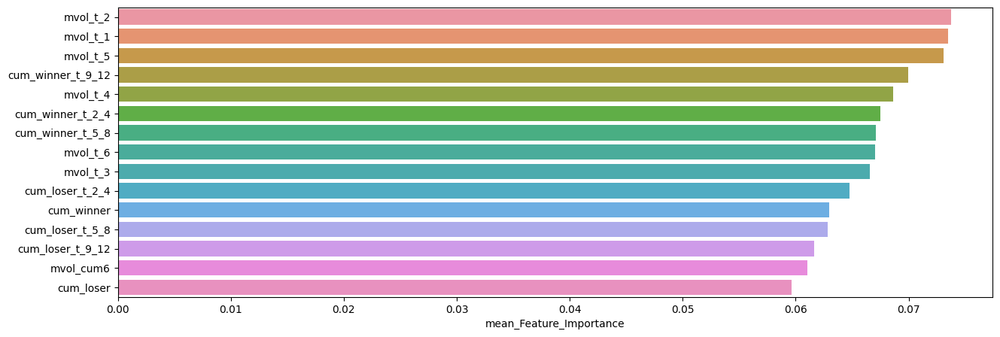

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.073736,0.086492,0.057529
mvol_t_1,0.073505,0.087151,0.066192
mvol_t_5,0.073114,0.093633,0.063911
cum_winner_t_9_12,0.069944,0.080474,0.059452
mvol_t_4,0.068606,0.081058,0.060884
cum_winner_t_2_4,0.067520,0.080849,0.058152
cum_winner_t_5_8,0.067073,0.085015,0.057816
mvol_t_6,0.067002,0.084579,0.056476
mvol_t_3,0.066557,0.075707,0.052820
cum_loser_t_2_4,0.064784,0.083911,0.055507


In [83]:
Expanding_RDF_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                      model=RDF, # 사용할 모델
                                      model_name='RDF', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.43      0.27      0.33        75
         1.0       0.69      0.82      0.75       151

    accuracy                           0.64       226
   macro avg       0.56      0.54      0.54       226
weighted avg       0.60      0.64      0.61       226


accuracy : 0.6371681415929203

precision : 0.6927374301675978

recall : 0.8211920529801324

F1-Score : 0.7515151515151516



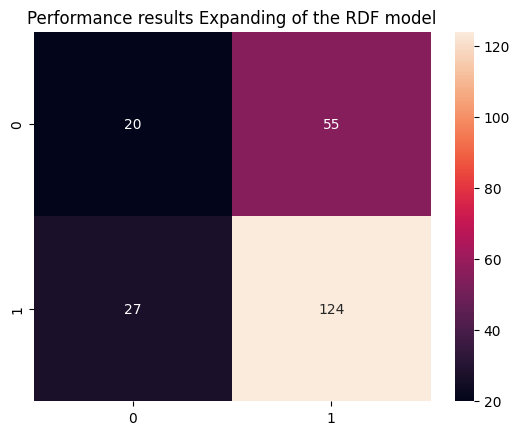


Feature Importance of the model



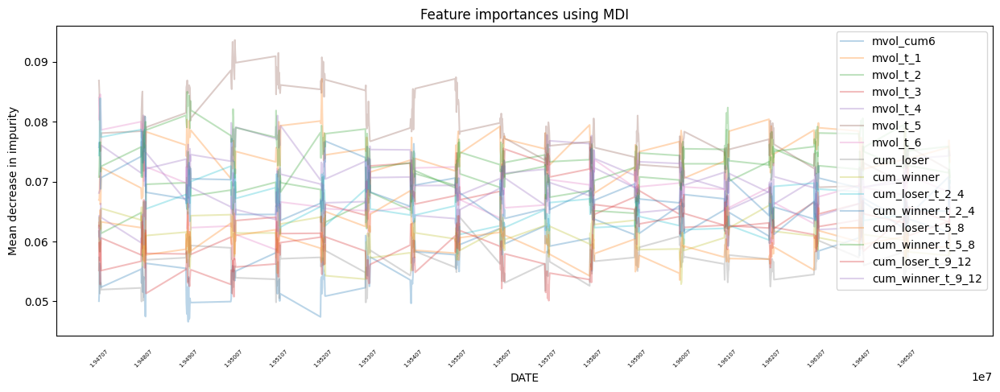

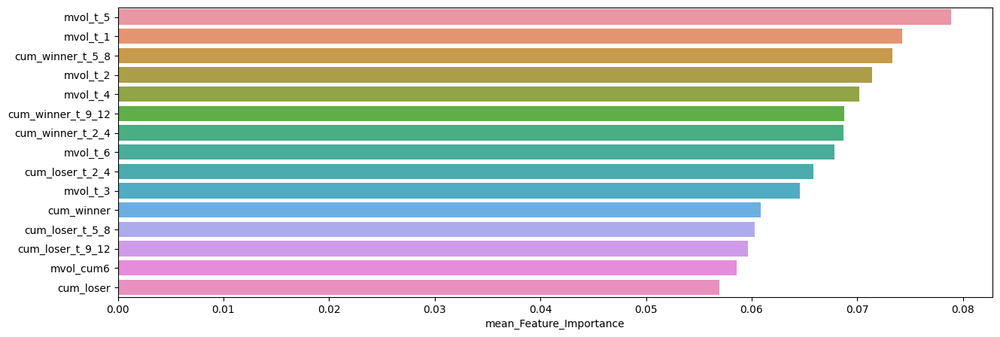

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.078860,0.093633,0.068365
mvol_t_1,0.074226,0.087151,0.066192
cum_winner_t_5_8,0.073297,0.085015,0.062337
mvol_t_2,0.071417,0.082356,0.057529
mvol_t_4,0.070192,0.081058,0.060884
cum_winner_t_9_12,0.068733,0.075528,0.059452
cum_winner_t_2_4,0.068658,0.080849,0.060715
mvol_t_6,0.067865,0.084579,0.058637
cum_loser_t_2_4,0.065850,0.083911,0.057931
mvol_t_3,0.064565,0.075707,0.052820



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.15      0.21        75
         1.0       0.67      0.87      0.76       151

    accuracy                           0.63       226
   macro avg       0.51      0.51      0.48       226
weighted avg       0.57      0.63      0.57       226


accuracy : 0.6283185840707964

precision : 0.6717948717948717

recall : 0.8675496688741722

F1-Score : 0.7572254335260115



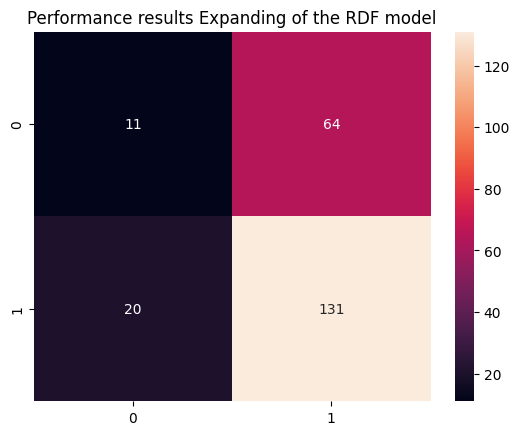


Feature Importance of the model



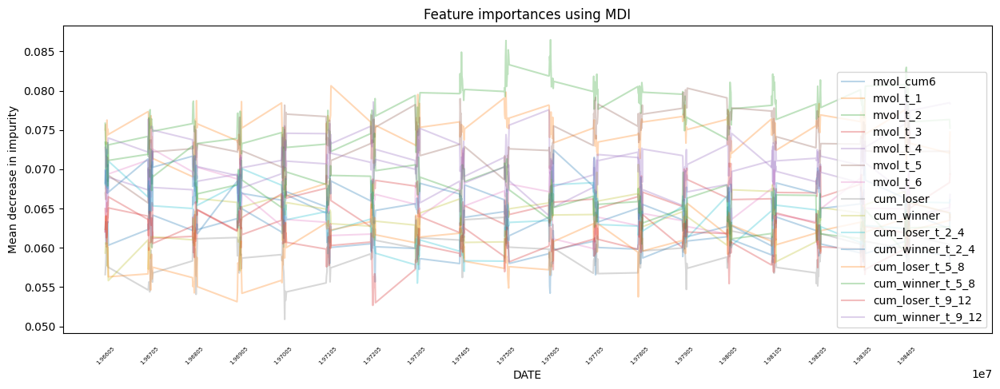

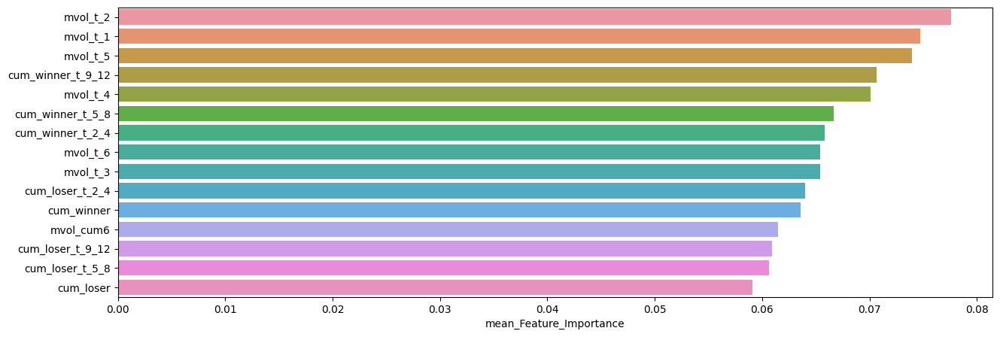

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.077574,0.086492,0.068885
mvol_t_1,0.074698,0.080637,0.066600
mvol_t_5,0.073961,0.080334,0.065726
cum_winner_t_9_12,0.070660,0.080474,0.063750
mvol_t_4,0.070081,0.078577,0.063810
cum_winner_t_5_8,0.066665,0.076537,0.059486
cum_winner_t_2_4,0.065836,0.072459,0.058152
mvol_t_6,0.065419,0.072869,0.059423
mvol_t_3,0.065416,0.070762,0.059142
cum_loser_t_2_4,0.063988,0.072517,0.055507



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.11      0.17        70
         1.0       0.69      0.90      0.79       156

    accuracy                           0.66       226
   macro avg       0.52      0.51      0.48       226
weighted avg       0.59      0.66      0.60       226


accuracy : 0.6592920353982301

precision : 0.6945812807881774

recall : 0.9038461538461539

F1-Score : 0.7855153203342619



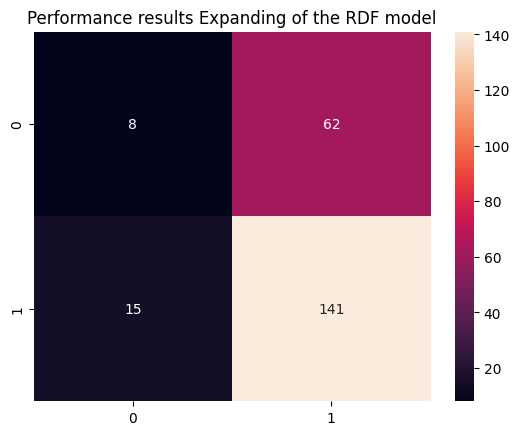


Feature Importance of the model



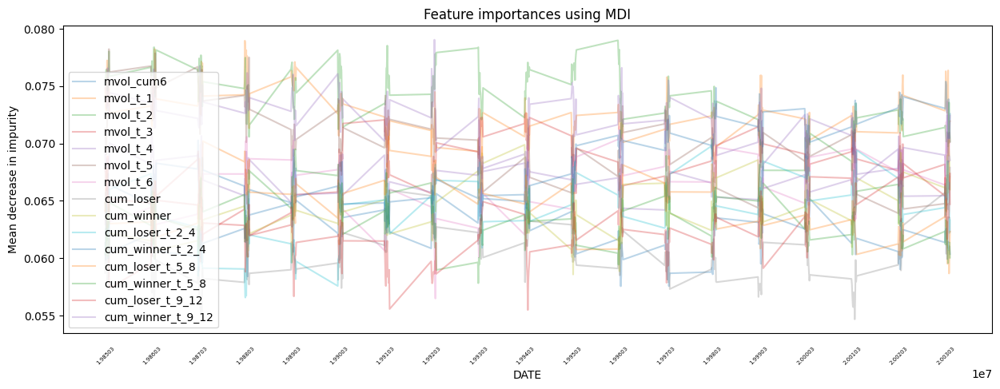

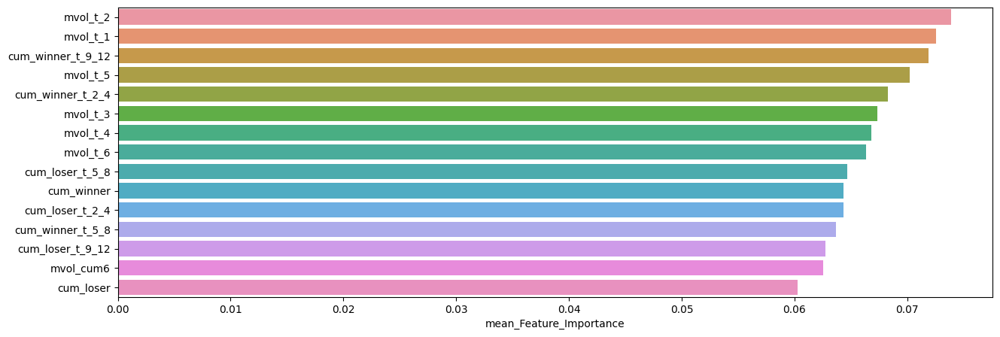

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.073873,0.078989,0.067629
mvol_t_1,0.072573,0.078958,0.067009
cum_winner_t_9_12,0.071872,0.079041,0.063762
mvol_t_5,0.070215,0.078225,0.063911
cum_winner_t_2_4,0.068266,0.075394,0.061392
mvol_t_3,0.067351,0.072663,0.057365
mvol_t_4,0.066837,0.072041,0.062204
mvol_t_6,0.066355,0.073661,0.056476
cum_loser_t_5_8,0.064669,0.071974,0.058661
cum_winner,0.064379,0.070324,0.058575



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.47      0.18      0.26        96
         1.0       0.59      0.86      0.70       132

    accuracy                           0.57       228
   macro avg       0.53      0.52      0.48       228
weighted avg       0.54      0.57      0.51       228


accuracy : 0.5701754385964912

precision : 0.5885416666666666

recall : 0.8560606060606061

F1-Score : 0.6975308641975309



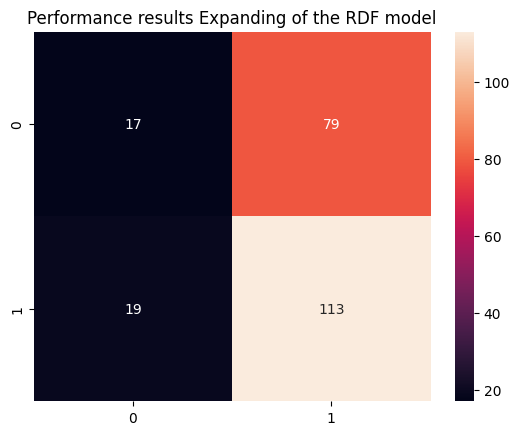


Feature Importance of the model



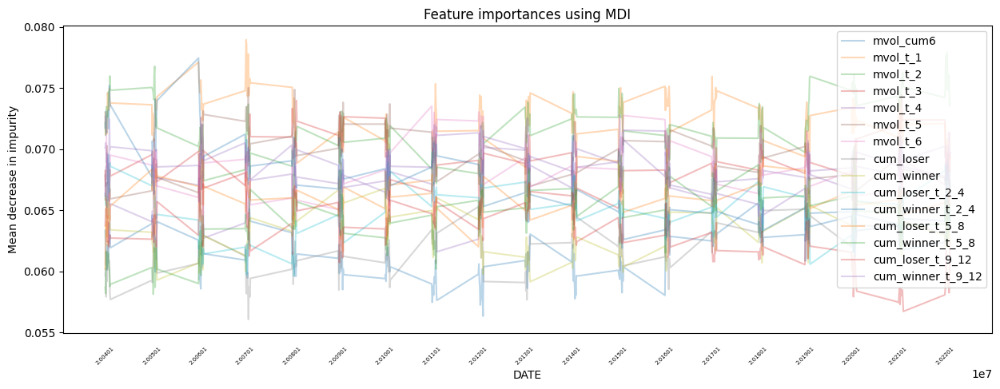

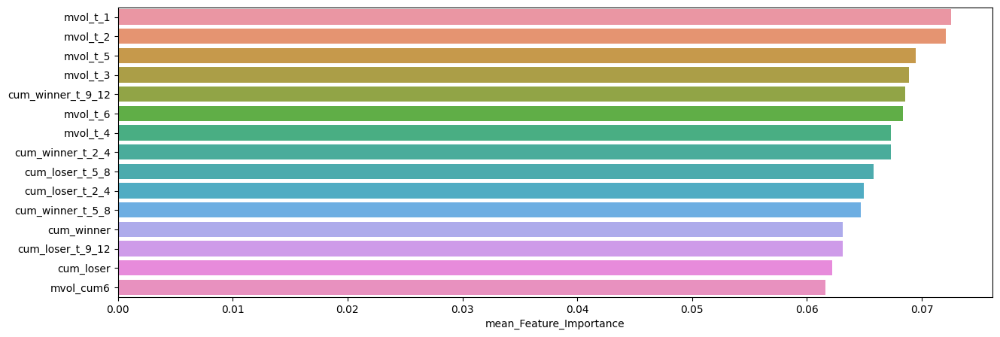

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.072530,0.078958,0.067083
mvol_t_2,0.072096,0.077946,0.067116
mvol_t_5,0.069452,0.075032,0.065631
mvol_t_3,0.068875,0.074472,0.063754
cum_winner_t_9_12,0.068521,0.072779,0.063211
mvol_t_6,0.068357,0.073536,0.062576
mvol_t_4,0.067326,0.071564,0.061616
cum_winner_t_2_4,0.067322,0.077469,0.061918
cum_loser_t_5_8,0.065821,0.070026,0.060188
cum_loser_t_2_4,0.064967,0.069785,0.059629


In [84]:
slice_feature_importance(Expanding_RDF_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'RDF') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



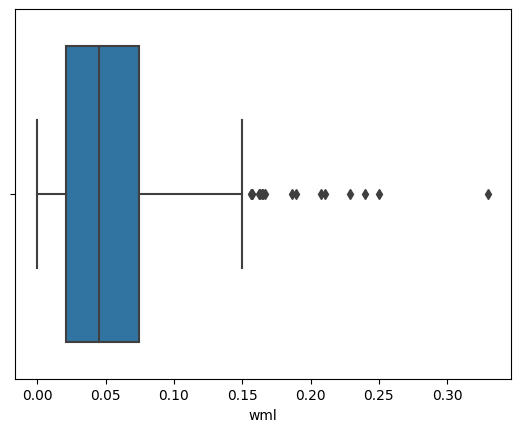

,count,mean,std,min,25%,50%,75%,max
wml,509.0,0.053467,0.043931,0.000007,0.020642,0.045038,0.074144,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



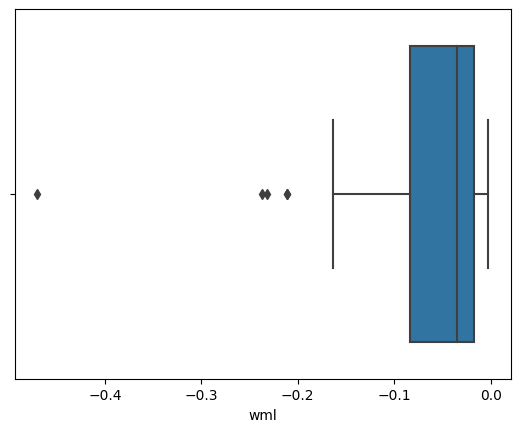

,count,mean,std,min,25%,50%,75%,max
wml,56.0,-0.067545,0.082077,-0.469903,-0.083147,-0.034668,-0.017762,-0.002454



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



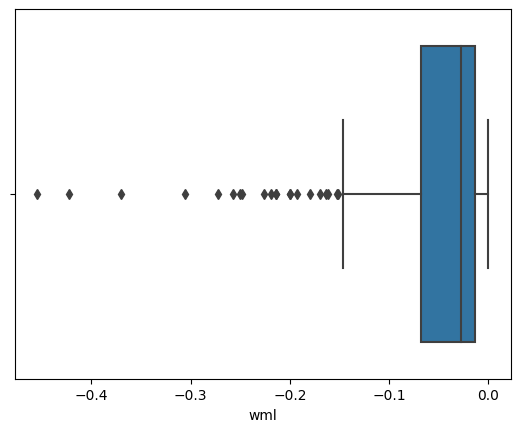

,count,mean,std,min,25%,50%,75%,max
wml,260.0,-0.053891,0.068614,-0.454349,-0.067487,-0.027505,-0.013737,-0.000132



틀린 예측 날짜


19480131, 19490131, 19490331, 19490630, 19490930, 19500131, 19500429, 19500630, 19500731, 
19510331, 19510531, 19510629, 19510831, 19510928, 19520229, 19520731, 19521128, 19530227, 
19540528, 19541231, 19550729, 19551031, 19551230, 19560131, 19570131, 19580131, 19580529, 
19580731, 19580829, 19580930, 19581231, 19590529, 19590731, 19591231, 19600129, 19600729, 
19610531, 19610929, 19611229, 19620131, 19620330, 19621130, 19630628, 19640630, 19640731, 
19650129, 19650226, 19650630, 19651231, 19660531, 19660831, 19660930, 19661031, 19661230, 
19670731, 19670831, 19680131, 19680229, 19680628, 19680730, 19681031, 19690228, 19690630, 
19700831, 19701231, 19710129, 19710226, 19710331, 19710730, 19720831, 19721130, 19730731, 
19740329, 19750131, 19750228, 19750331, 19750530, 19751031, 19760227, 19760528, 19760630, 
19770228, 19770831, 19780428, 19780929, 19781031, 19790131, 19790228, 19790330, 19790731, 
19800530, 19800731, 19801231, 19810331, 19810430, 19810630, 19810731, 19810831

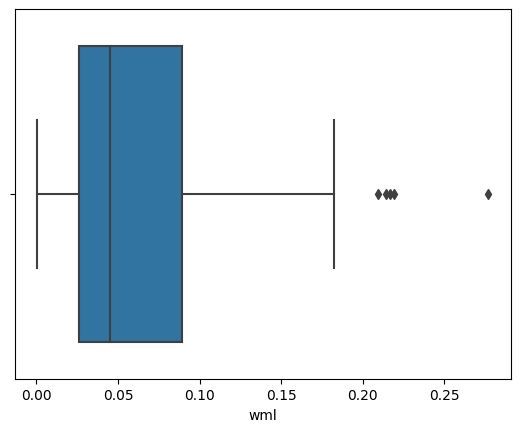

,count,mean,std,min,25%,50%,75%,max
wml,81.0,0.066451,0.061081,0.000627,0.026238,0.045141,0.089275,0.276912



틀린 예측 날짜


19480228, 19480430, 19480528, 19481130, 19490531, 19490831, 19491031, 19491130, 19500531, 
19501031, 19510131, 19511031, 19511231, 19520131, 19520529, 19530130, 19530430, 19540226, 
19581031, 19630228, 19630329, 19640228, 19660131, 19660331, 19661130, 19670331, 19700227, 
19700430, 19710430, 19720131, 19720229, 19730228, 19730330, 19730831, 19731231, 19740228, 
19810227, 19820930, 19830228, 19830331, 19831130, 19840928, 19880229, 19901231, 19910531, 
19970630, 19990630, 19990831, 19990930, 20000630, 20001229, 20010228, 20010330, 20010531, 
20030731, 20040130, 20040331, 20080229, 20080930, 20090130, 20090227, 20100331, 20100430, 
20140131, 20150731, 20150930, 20161031, 20170331, 20180831, 20180928, 20190531, 20200131, 



In [85]:
RDF_A0_P1, RDF_A1_P0 = What_Pred(Expanding_RDF_Result, WML, 'RDF')

Sharpe Ratio : 0.71376

최근 누적 수익률

  2022년-12월 -> 53209.86
  2022년-11월 -> 47941.06
  2022년-10월 -> 45602.02
  2022년-09월 -> 40379.89
  2022년-08월 -> 36711.24

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2008년-11월 -> 73895.79
  2등 : 2009년-02월 -> 72146.72
  3등 : 2009년-01월 -> 72146.72
  4등 : 2008년-12월 -> 72146.72
  5등 : 2008년-10월 -> 67386.69
  6등 : 2002년-07월 -> 65190.44
  7등 : 2008년-06월 -> 63617.34
  8등 : 2008년-09월 -> 63617.34
  9등 : 2008년-08월 -> 63617.34
  10등 : 2008년-07월 -> 63617.34



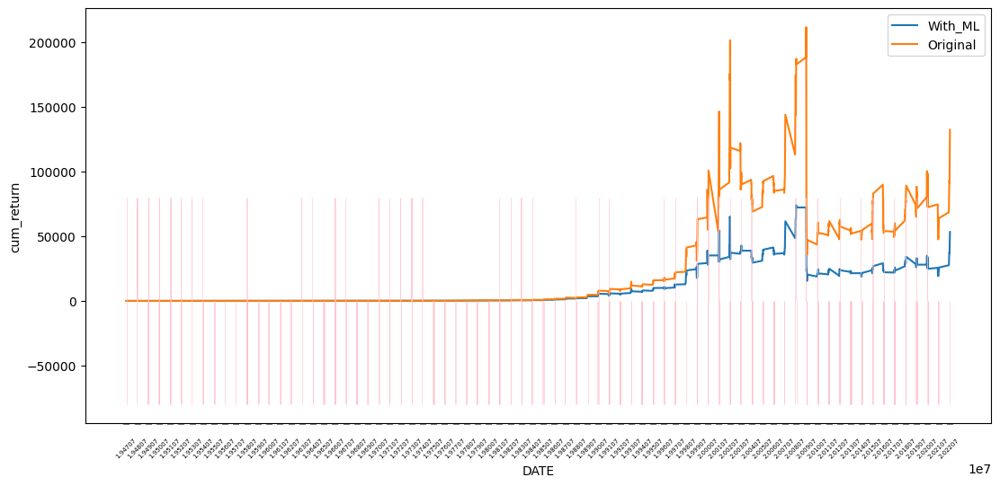

In [86]:
RDF_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_RDF_Result,
                                                 WML,
                                                 'RDF_PRED_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.72304

최근 누적 수익률

  2022년-12월 -> 9635.06
  2022년-11월 -> 9048.30
  2022년-10월 -> 8795.63
  2022년-09월 -> 8017.87
  2022년-08월 -> 7550.03

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 9635.06
  2등 : 2009년-02월 -> 9519.23
  3등 : 2008년-11월 -> 9073.14
  4등 : 2022년-11월 -> 9048.30
  5등 : 2009년-01월 -> 9019.74
  6등 : 2008년-12월 -> 8961.46
  7등 : 2022년-10월 -> 8795.63
  8등 : 2008년-10월 -> 8498.45
  9등 : 2008년-06월 -> 8369.64
  10등 : 2008년-09월 -> 8187.93



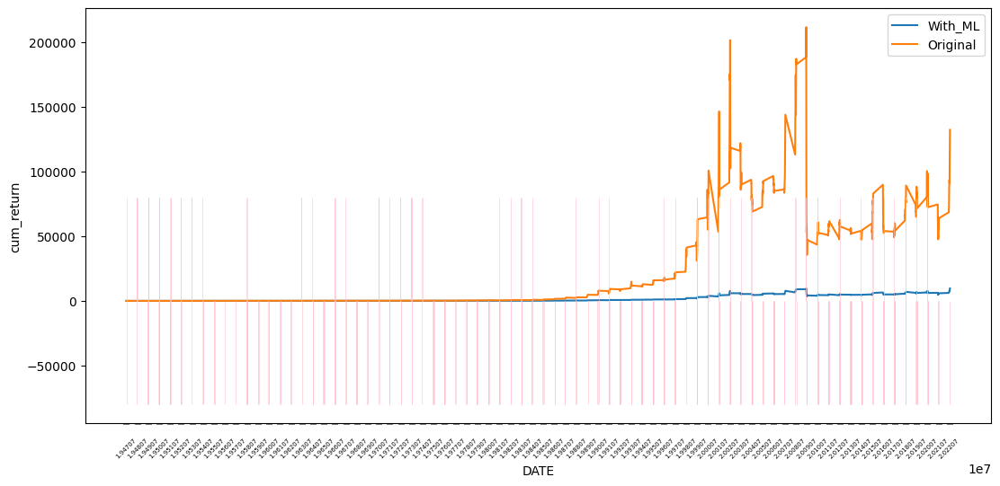

In [87]:
RDF_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_RDF_Result,
                                                 WML,
                                                 'RDF_PROB_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

### Grdient Boosting

In [88]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

In [ ]:
Expanding_GBC_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                      model=GBC, # 사용할 모델
                                      model_name='GBC', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부

**************************************************

GBC Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]

In [ ]:
slice_feature_importance(Expanding_GBC_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'GBC') # 모델 명

In [ ]:
GBC_A0_P1, GBC_A1_P0 = What_Pred(Expanding_GBC_Result, WML, 'GBC')

In [ ]:
GBC_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_GBC_Result,
                                                 WML,
                                                 'GBC_PRED_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

In [ ]:
GBC_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_GBC_Result,
                                                  WML,
                                                  'GBC_PROB_POS_WML',
                                                  GBC_A0_P1,
                                                  GBC_A1_P0,
                                                  plot=True)

### XGB

In [ ]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

In [ ]:
Expanding_XGB_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                  model=XGB, # 사용할 모델
                                  model_name='XGB', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부

In [ ]:
slice_feature_importance(Expanding_XGB_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'XGB') # 모델 명

In [ ]:
XGB_A0_P1, XGB_A1_P0 = What_Pred(Expanding_XGB_Result, WML, 'XGB')

In [ ]:
XGB_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_XGB_Result,
                                                 WML,
                                                 'XGB_PRED_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

In [ ]:
XGB_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_XGB_Result,
                                                 WML,
                                                 'XGB_PROB_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

### LGBM

In [ ]:
LGBM_param = {}
LGBM = LGBMClassifier(**LGBM_param, random_state=42)

In [ ]:
Expanding_LGBM_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                    window_size=240, # window size (훈련 데이터 셋 크기)
                                    method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                    model=LGBM, # 사용할 모델
                                    model_name='LGBM', # 사용한 모델 명
                                    plot=True, # 모델 성능 지표 시각화 여부
                                    plot_feature=True) # 모델의 변수 중요도 시각화 여부

In [ ]:
slice_feature_importance(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                        4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                        'Expanding', # Rolling Windows Method
                        'LGBM') # 모델 명

In [ ]:
LGBM_A0_P1, LGBM_A1_P0 = What_Pred(Expanding_LGBM_Result,
                                   WML,
                                   'LGBM')

In [ ]:
LGBM_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PRED_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

In [ ]:
LGBM_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PROB_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부